# **Project Name**    -Appliance Energy Prediction



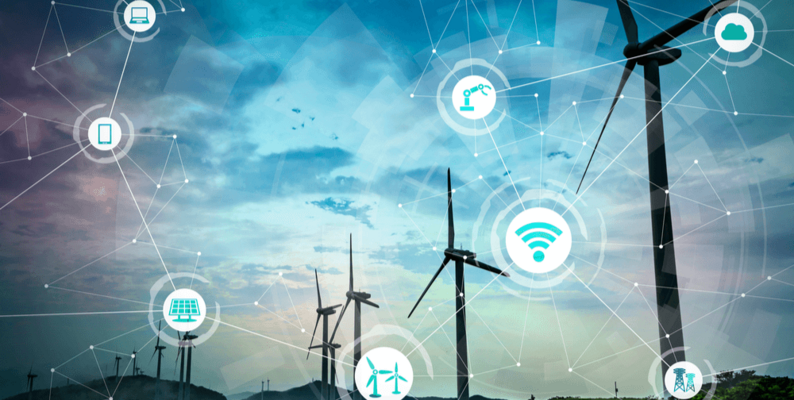

# **Project Summary -**

Energy is critical to economic and social growth.It enables nations to achieve their aim of higher living conditions.

So, these days, planning and operating energy production and consumption is a must.Understanding how energy is used is necessary for better management. This presented an opportunity to create a supervised machine learning method to forecast Appliance Energy use.

The initial phase, based on our dataset, was data prepressing. I understood the data and discovered that there are no null values in the dataset, and I received a detailed description of the characteristics involved.

Following that, Exploratory Data Analysis and Data Visualisation produced a concise knowledge of the link between features and label, i.e., the dependent variable It has also given an idea of the features to be chosen for the next step.The heatmap was utilised to understand the association between independent variables, based on which important features were chosen.Choosing the right elements to improve accuracy was difficult.

Standardisation was a critical step before fitting the model since it ensured that the feature values in the data had a zero mean and unit variance. When we construct any Machine Learning method, there is a chance that the objective function will not perform properly unless it is normalised.

Following completion of training and assessment. Linear, Lasso, Ridge, Elasticnet, Gradient Boosting, Random Forest, and XGBoosting techniques were employed. We checked and compared numerous matrices and determined that the Random Forest Regressor produces the best results.

I used the ExtraTreeRegressor and used Hyperparameter Tuning to improve accuracy and prevent overfitting. I also used Gridsearch cross validation to find the optimal parameter. These parameters improved our model's prediction performance.
Finally, we performed Model Explainability using ELI5, which assisted us in understanding the participation of features and their impact on the target variables.
To summarise, the ExtraTreeRegressor has proven to be the best model for our dataset.


# **GitHub Link -**

<a href="https://github.com/priyatampintu/Real-Time-Appliances-Energy-Prediction-Model" rel="nofollow" target="_blank">Github</a>

# Try it Demo

<a href="http://20.199.42.42:8504" rel="nofollow" target="_blank">Demo</a>

# **Problem Statement**


For approximately 4.5 months, the data set is set to 10 minutes. A **ZigBee wireless sensor network** was used to monitor the house's temperature and humidity levels. Every wireless node reported the temperature and humidity levels every 3.3 minutes. The wireless data was then averaged over 10 minute periods. The energy data was recorded every 10 minutes using **m-bus energy metres**. Weather from the nearest **airport weather station (Chievres Airport, Belgium)** was collected from a public data set from Reliable Prognosis (rp5.ru) and blended with the experimental data sets using the date and time columns. Two random variables were included in the data set to test the regression models and to filter out non-predictive features (parameters).

The problem statement is to create a machine learning model that can accurately forecast energy usage based on the supplied features. This might be valuable for **building managers, energy firms, and policymakers** who need to optimise energy consumption, cut costs, and minimise the environmental impact of energy usage.

Specifically, the model should be able to reliably anticipate energy usage based on the different elements that influence energy consumption, such as temperature, humidity, illumination, and time of day. This can assist building managers and energy firms in identifying patterns and trends in energy consumption and making informed energy decisions, such as altering HVAC settings, optimising lighting, or introducing energy-efficient solutions. Policymakers can also utilise this data to create regulations and incentives that encourage energy efficiency and sustainability.




# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [5]:
# Import Libraries for analysis and visualisation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
%matplotlib inline

## to import datetime library
from datetime import datetime
import datetime as dt

## Library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings('ignore')

#Import necessary statistical libraries
import scipy.stats as stats
import statsmodels.api as sm
from scipy.stats import norm
#import libraries for ML-Model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import  MinMaxScaler
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.linear_model import  LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import  BaggingRegressor, ExtraTreesRegressor, RandomForestRegressor,StackingRegressor
from sklearn.model_selection import GridSearchCV
from xgboost import XGBRegressor
import lightgbm
from lightgbm import LGBMRegressor
# libraries for save the model
import pickle

### Dataset Loading

In [ ]:
# Load Dataset


In [ ]:
from google.colab import drive
drive.mount('/content/drive')



In [9]:
App_df = pd.read_csv('data_application_energy.csv')

### Dataset First View

In [10]:
# Dataset First Look
App_df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


### Dataset Rows & Columns count

In [11]:
# Dataset Rows & Columns count
App_df.info()
App_df.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

(19735, 29)

#Shape of the data frame is (19735*29) rows =19735 columns=29
#Therer is no null objects present in the dataset

### Dataset Information

In [12]:
# Dataset Info
App_df.info()
App_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


#### Duplicate Values

In [13]:
Columns = App_df.columns
Columns

dup = App_df.pivot_table(index=['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3','RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
                                'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed','Visibility', 'Tdewpoint', 'rv1', 'rv2'],aggfunc='size')

print(dup)

date                 Appliances  lights  T1         RH_1       T2         RH_2       T3         RH_3       T4         RH_4       T5         RH_5       T6         RH_6       T7         RH_7       T8       RH_8       T9         RH_9     T_out      Press_mm_hg  RH_out     Windspeed  Visibility  Tdewpoint  rv1        rv2      
2016-01-11 17:00:00  60          30      19.890000  47.596667  19.200000  44.790000  19.790000  44.730000  19.000000  45.566667  17.166667  55.200000  7.026667   84.256667  17.200000  41.626667  18.2000  48.900000  17.033333  45.5300  6.600000   733.5        92.000000  7.000000   63.000000   5.300000   13.275433  13.275433    1
2016-01-11 17:10:00  60          30      19.890000  46.693333  19.200000  44.722500  19.790000  44.790000  19.000000  45.992500  17.166667  55.200000  6.833333   84.063333  17.200000  41.560000  18.2000  48.863333  17.066667  45.5600  6.483333   733.6        92.000000  6.666667   59.166667   5.200000   18.606195  18.606195    1
2016-01-11 17:2

In [14]:
# Get count duplicates for each unique row

dup_Count =  len(App_df)-len(App_df.drop_duplicates())     # give the total nu,ber of duplicate values  '0'.
dup_Count                                                            #there is no duplicate values presetn in the data frame i.e no row is repeteted tin the data frame

0

In [15]:
dup_count1 = App_df[App_df.duplicated()].shape
dup_count1

(0, 29)

#### Missing Values/Null Values

In [16]:
# Missing Values/Null Values Count
Null_values = App_df.isnull().sum()
Null_values

date           0
Appliances     0
lights         0
T1             0
RH_1           0
T2             0
RH_2           0
T3             0
RH_3           0
T4             0
RH_4           0
T5             0
RH_5           0
T6             0
RH_6           0
T7             0
RH_7           0
T8             0
RH_8           0
T9             0
RH_9           0
T_out          0
Press_mm_hg    0
RH_out         0
Windspeed      0
Visibility     0
Tdewpoint      0
rv1            0
rv2            0
dtype: int64

<Figure size 720x720 with 0 Axes>

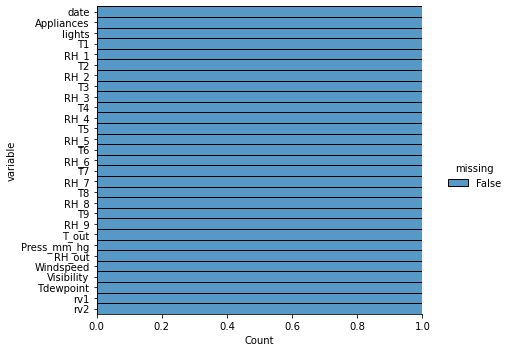

In [17]:
# Visualizing the missing values
plt.figure(figsize=(10,10))
sns.displot(
    data=App_df.isna().melt(value_name="missing"),
    y="variable",
    hue="missing",
    multiple="fill",
    aspect=1.25
)
plt.savefig("visualizing_missing_data_with_barplot_Seaborn_distplot.png", dpi=100)


### What did i know about dataset?

* The dataset provided contains 29 columns and 19735 rows and does not have any missing or duplicate values.


* The goal is to predict the energy use of appliances. Demand prediction involves analytical studies on the probability of house temperature and humidity conditions, which were monitored with a ZigBee wireless sensor network for 10 minutes for about 4.5 months.

* There are no duplicate columns

* There are no missing values

## ***2. Understanding Your Variables***

In [18]:
# Dataset Columns
App_df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [19]:
# Dataset Describe
App_df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


### Variables Description


**Date time year-**month-day hour:minute:second

**Appliances-** energy use in Wh

**Lights-** energy use of light fixtures in the house in Wh(watt per hour)

**T1-** Temperature in kitchen area, in Celsius

**RH_1-** Humidity in kitchen area, in %

**T2-**Temperature in living room area, in Celsius

**RH_2-** Humidity in living room area, in %

**T3-** Temperature in laundry room area

**RH_3-** Humidity in laundry room area, in %

**T4-** Temperature in office room, in Celsius

**RH_4-** Humidity in office room, in %

**T5-** Temperature in bathroom, in Celsius

**RH_5-** Humidity in bathroom, in %

**T6-** Temperature outside the building (north side), in Celsius

**RH_6-** Humidity outside the building (north side), in %

**T7-**Temperature in ironing room , in Celsius

**RH_7-** Humidity in ironing room, in %

**T8-** Temperature in teenager room 2, in Celsius

**RH_8-** Humidity in teenager room 2, in %

**T9-**Temperature in parents room, in Celsius

**RH_9-** Humidity in parents room, in %

**To-**Temperature outside (from Chievres weather station), in Celsius

**Pressure (from Chievres weather station)-** in mm Hg

**RH_out-** Humidity outside (from Chievres weather station), in %

**Wind speed (from Chievres weather station)-** in m/s

**Visibility (from Chievres weather station)-**in km

**Tdewpoint (from Chievres weather station)-** Â°C

**rv1-** Random variable 1, nondimensional

**rv2-** Random variable 2, nondimensional

Where indicated, hourly data (then interpolated) from the nearest airport weather station (Chievres Airport, Belgium) was downloaded from a public data set from Reliable Prognosis, rp5.ru. Permission was obtained from Reliable Prognosis for the distribution of the 4.5 months of weather data.

### Check Unique Values for each variable.

In [20]:
# Check Unique Values for each variable.
def get_unqiuevalues(df1):
    unique_values=df1.apply(pd.Series.unique)
    return unique_values

unq_values = get_unqiuevalues(App_df)

# Check Unique Values for each variable.
for i in App_df.columns.tolist():
    print("No. of unique values in ",i,"is",App_df[i].nunique())


No. of unique values in  date is 19735
No. of unique values in  Appliances is 92
No. of unique values in  lights is 8
No. of unique values in  T1 is 722
No. of unique values in  RH_1 is 2547
No. of unique values in  T2 is 1650
No. of unique values in  RH_2 is 3376
No. of unique values in  T3 is 1426
No. of unique values in  RH_3 is 2618
No. of unique values in  T4 is 1390
No. of unique values in  RH_4 is 2987
No. of unique values in  T5 is 2263
No. of unique values in  RH_5 is 7571
No. of unique values in  T6 is 4446
No. of unique values in  RH_6 is 9709
No. of unique values in  T7 is 1955
No. of unique values in  RH_7 is 5891
No. of unique values in  T8 is 2228
No. of unique values in  RH_8 is 6649
No. of unique values in  T9 is 924
No. of unique values in  RH_9 is 3388
No. of unique values in  T_out is 1730
No. of unique values in  Press_mm_hg is 2189
No. of unique values in  RH_out is 566
No. of unique values in  Windspeed is 189
No. of unique values in  Visibility is 413
No. of uni

## 3. ***Data Wrangling***

### Data Wrangling Code

In [21]:
# Write your code to make your dataset analysis ready.
df_energy = App_df.copy()
df_energy.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [22]:
#rename the columns
df_energy.rename(columns={'T1': 'temp_kitchen', 'RH_1':'hu_Kitchen', 'T2':'temp_living_room', 'RH_2': 'hu_living', 'T3':'temp_Laundry_room',
       'RH_3':'hu_laundry', 'T4':'temp_office_room', 'RH_4':'hu_office', 'T5':'temp_bathroom', 'RH_5':'hu_bath', 'T6':'temp_build_out'
       , 'RH_6':'hu_build_out', 'T7':'temp_ironing_room', 'RH_7':'hu_ironing_room', 'T8':'temp_teen_room',
       'RH_8':'hu_teen', 'T9':'temp_parents_room', 'RH_9':'hu_parent', 'T_out':'temp_out', 'RH_out':'out_humidity'},inplace = True)

In [23]:
df_energy.columns

Index(['date', 'Appliances', 'lights', 'temp_kitchen', 'hu_Kitchen',
       'temp_living_room', 'hu_living', 'temp_Laundry_room', 'hu_laundry',
       'temp_office_room', 'hu_office', 'temp_bathroom', 'hu_bath',
       'temp_build_out', 'hu_build_out', 'temp_ironing_room',
       'hu_ironing_room', 'temp_teen_room', 'hu_teen', 'temp_parents_room',
       'hu_parent', 'temp_out', 'Press_mm_hg', 'out_humidity', 'Windspeed',
       'Visibility', 'Tdewpoint', 'rv1', 'rv2'],
      dtype='object')

In [24]:
df_energy.head()

,date,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,...,temp_parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


In [25]:
df_energy.describe()

,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,temp_parents_room,hu_parent,temp_out,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [26]:
import pandas as pd

# Assuming your dataframe has a 'timestamp' column
# To generate a sample dataframe for demonstration:


# Convert the 'timestamp' column to datetime
df_energy['date']=pd.to_datetime(df_energy['date'])

#Getting the months and days from date

df_energy['month'] = df_energy['date'].dt.month
df_energy['weekday'] = df_energy['date'].dt.weekday
df_energy['hour'] = df_energy['date'].dt.hour

#drop the date column
df_energy.drop('date',axis=1,inplace=True)


# Print the updated dataframe
df_energy.head()

,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Press_mm_hg,out_humidity,Windspeed,Visibility,Tdewpoint,rv1,rv2,month,weekday,hour
0,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433,1,0,17
1,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195,1,0,17
2,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668,1,0,17
3,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389,1,0,17
4,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097,1,0,17


In [27]:
#separate column list for better analysis
temp_cols=['temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','temp_build_out','temp_ironing_room','temp_teen_room','temp_parents_room']
hu_cols=['hu_Kitchen','hu_living','hu_laundry', 'hu_office','hu_bath','hu_build_out','hu_ironing_room','hu_teen','hu_parent']
light_cols=['light']
weather_cols=['temp_out','out_humidity',"Tdewpoint","Press_mm_hg","Windspeed","Visibility"]
date_col = ['month','weekday','hour']
random_col = ["rv1","rv2"]

### What all manipulations have i done and insights i found?

1. Splitting date columns into hour,weekdays, months.
2. It will help in analysing the data on the bases of months, days and hours.
3. Dropped date column due to no further use of them.
4. Renaming of some features, for better understanding and readability

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

### Exploratory Data Analysis

#### Chart - 1

<AxesSubplot:xlabel='Appliances', ylabel='Density'>

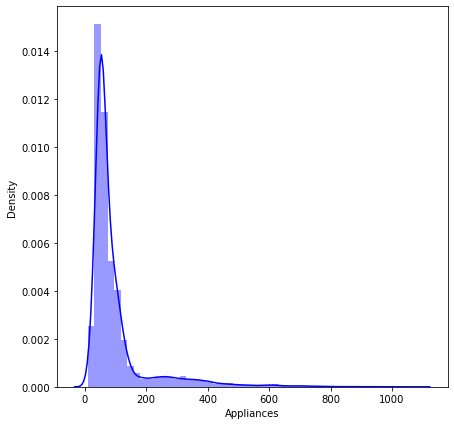

In [28]:
# Chart - 1 visualization code
#Dependent varaible "Appliance"
plt.figure(figsize=(7,7))
sns.distplot(df_energy['Appliances'], color = 'Blue')

##### 1. Why did i pick the specific chart?

sitplot is to check the distrubtion of the dependent variable "Appliances"

##### 2. What is/are the insight(s) found from the chart?

the dependent varaible "appliances" has postive skweness that data is more likely distrubted in the right hand side of the mean

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

we need to the deal with skewness by applying log tansfromation to get the skewness in to noraml disturbtion to anlaze the data

#### Chart - 2

<AxesSubplot:xlabel='Appliances', ylabel='Density'>

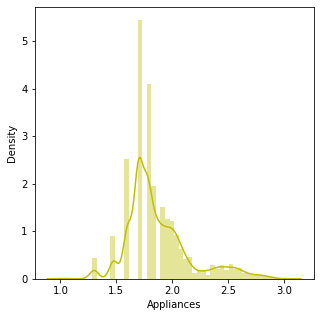

In [29]:
# Chart - 2 visualization code
# Dependent variable 'Price'
plt.figure(figsize=(5,5))
sns.distplot(np.log10(df_energy['Appliances']),color="y")

##### 1. Why did i pick the specific chart?

Distplot to get the skweness of the data i.e dependent varibale "appplicance on log scale

##### 2. What is/are the insight(s) found from the chart?

 The data is more likely normal disturbted

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Now the data is normally distrubted that is many assumption of the varable to analyze the data or applying the linear regression model

#### Chart - 3

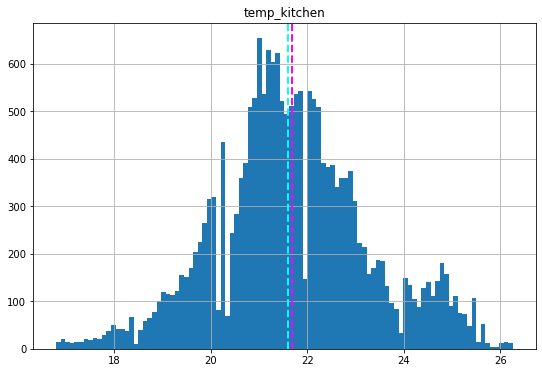

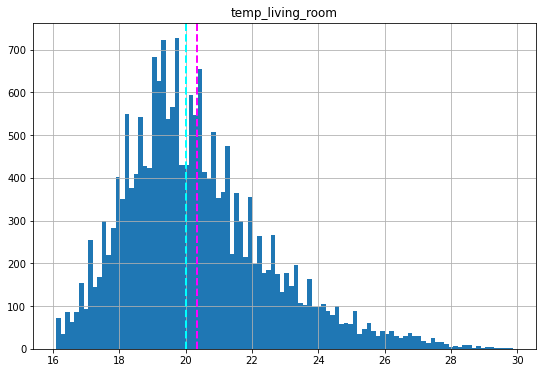

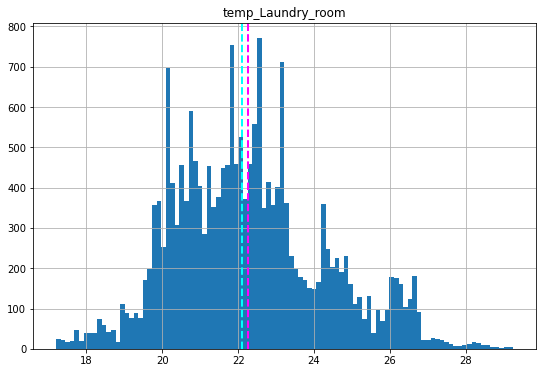

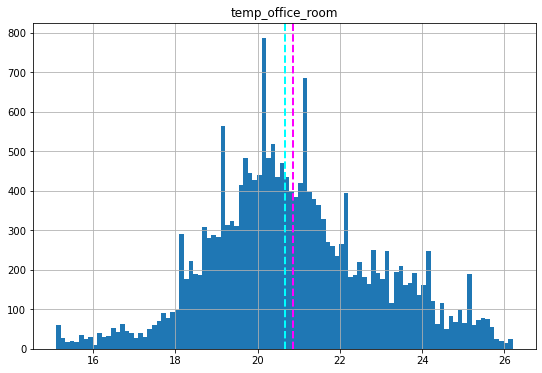

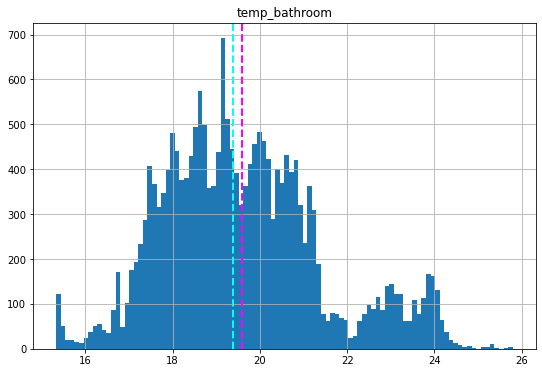

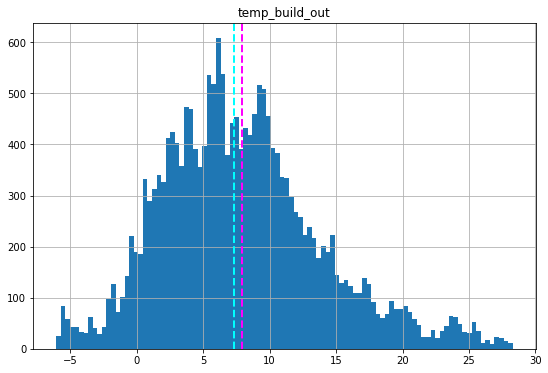

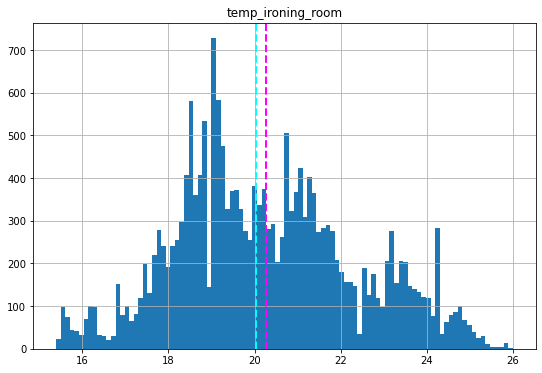

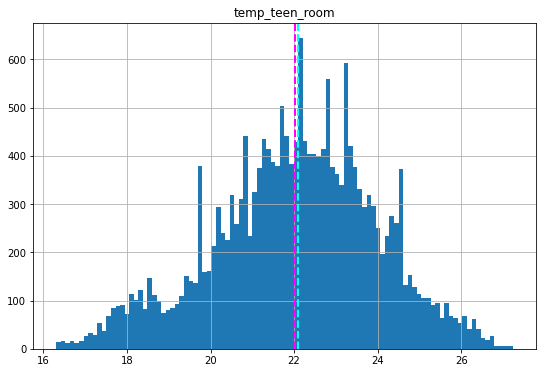

In [30]:
# Chart - 3 visualization code
#@title Default title text
# plot a bar plot for each numerical feature count

for col in temp_cols[:-1]:
    fig = plt.figure(figsize=(9,6))
    ax = fig.gca()
    feature = (df_energy[col])
    feature.hist(bins=100, ax = ax)
    ax.axvline(df_energy[col].mean(), color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(), color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(col)
plt.show()

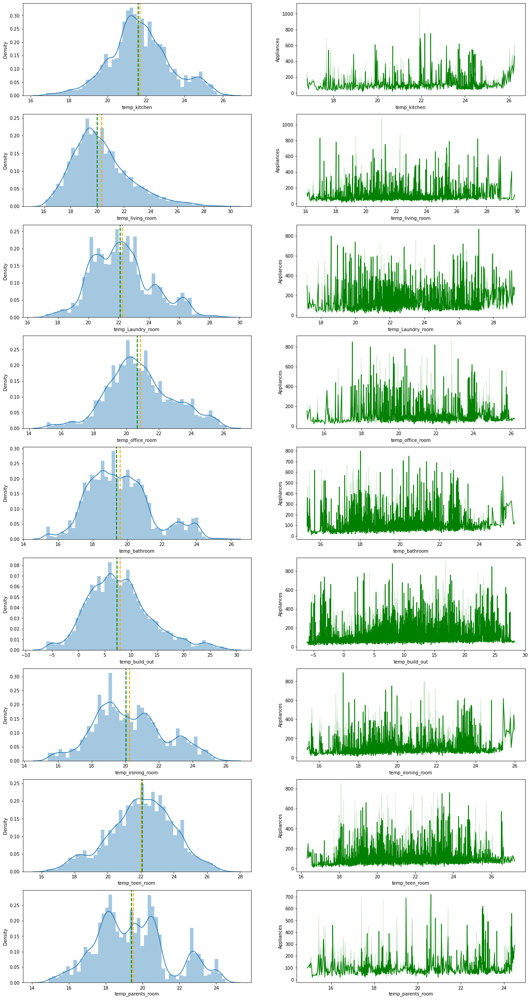

In [31]:
n=len(temp_cols)
fig,ax=plt.subplots(len(temp_cols),2,figsize=(20,40))
for i,col in enumerate(temp_cols):
    #univariate of the columns
    dist=sns.distplot(df_energy[col],ax=ax[i,0])
    ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
    ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
    #Bivariate Analysis the Appliance Energy
    #lineplot
    scatter=sns.lineplot(data=df_energy,x=col,y='Appliances',color='green',ax=ax[i,1]);


In [32]:
for col  in temp_cols:
    skewness = df_energy[col].skew(axis=0, skipna = True)
    print("The skweness of " ,col ,"is",skewness  )

The skweness of  temp_kitchen is 0.12091711738520292
The skweness of  temp_living_room is 0.8896578498994725
The skweness of  temp_Laundry_room is 0.4507773351008748
The skweness of  temp_office_room is 0.17038405715992935
The skweness of  temp_bathroom is 0.5582196988262588
The skweness of  temp_build_out is 0.5974713395616409
The skweness of  temp_ironing_room is 0.2547224169425056
The skweness of  temp_teen_room is -0.25615113577916404
The skweness of  temp_parents_room is 0.3827112390301909


### Skewness Number



*   with the skewness number siginifes that how much it is devatited from the normal distrubtion
* If skewness is less than -1 or greater than 1, the distribution is highly skewed. If skewness is between -1 and -0.5 or between 0.5 and 1, the distribution is moderately skewed. If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.
* In our probelm most of the disturbtion follows more likely normal disturbtion with the modreate skewness



##### 1. Why did i pick the specific chart?

* Again, the reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.

* A scatterplot is used to plot how much a numerical feature is affected by another numerical value.

* A line plot is also used to observe how numerical values change over time.

##### 2. What is/are the insight(s) found from the chart?

* All Temperature columns are followed normally distribution except living  rooms temperature
* Inside buliding mean and median value of all room temperature lies between 19 to 22 degree celcius
* Outside buliding mean and median value of  temperature lies between 6 to 7 degree celcius
* The lines in nearly all of the columns follow the same pattern.
*  It could be due to the same type of relationship between temperature variables and the Appliances Energy Consumption.



##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* When inside building temperatures are below 18 degree celcius energy consumption is minmium means maximum energy can saved. (i.e in some cases only)
That is in comparsion with the other temperatuer stats

* All temperatures have similar relationship with appliance energy consumption.It leads to multicolinarity.These columns will be dropped in upcoming appropriate section.

#### Humidity Columns (UniVarit+Bivariate)

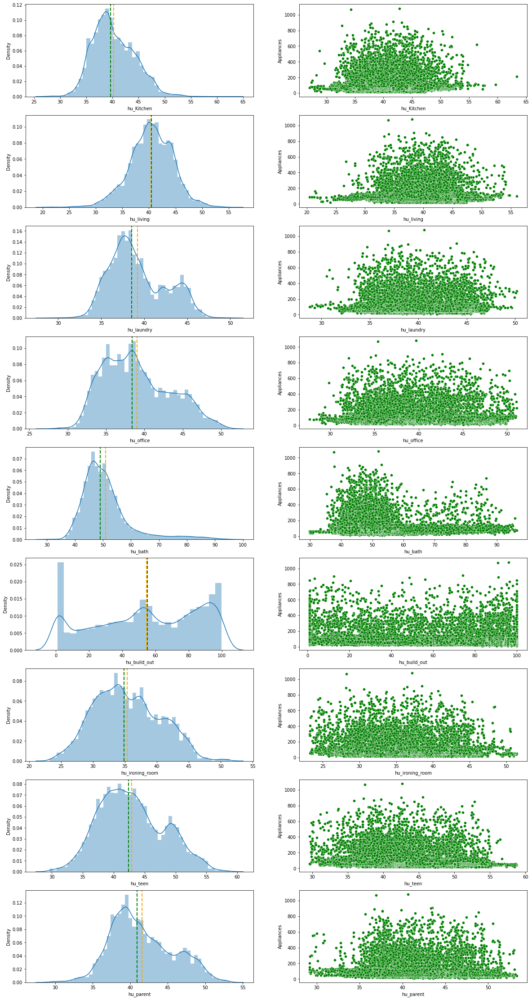

In [33]:
# Chart - 4 visualization code
fig,ax=plt.subplots(len(hu_cols),2,figsize=(20,40))
for i,col in enumerate(hu_cols):
    #univariate of the columns
    dist=sns.distplot(df_energy[col],ax=ax[i,0])
    ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
    ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
    #Bivariate Analysis the Appliance Energy
    #lineplot
    scatter=sns.scatterplot(data=df_energy,x=col,y='Appliances',color='green',ax=ax[i,1]);

In [34]:
for col  in hu_cols:
    skewness = df_energy[col].skew(axis=0, skipna = True)
    print("The skweness of " ,col ,"is",skewness  )

The skweness of  hu_Kitchen is 0.46577375642231555
The skweness of  hu_living is -0.26824717344228066
The skweness of  hu_laundry is 0.46758907995240717
The skweness of  hu_office is 0.4446143392062077
The skweness of  hu_bath is 1.8668200195471256
The skweness of  hu_build_out is -0.24196120045189282
The skweness of  hu_ironing_room is 0.24214082895027994
The skweness of  hu_teen is 0.30803561491175263
The skweness of  hu_parent is 0.36893704325030624


##### 1. Why did i pick the specific chart?

* Again, the reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.

* Regplot method is used to plot data and a linear regression model fit. we can observe if the feature  can fit with regression problem.

##### 2. What is/are the insight(s) found from the chart?

* All humidity distribution is follwed normal distribution except Humidit in bathroom building humidity.
*The living room and bulid out side humdityi is slightly negatively skewed and all the other humdity follows mostly normal disturbtion except for the bathroom humdity it is highly postively skewed.
* In inside building the mean and median value of humidity distribution lies between 35 to 45 percent,except bathroom humidity and it is near about 50 percent.
* For outside building humidity, the mean and median value is around 55 percent.
* For inside building low and high humidity causes low consumption of appliances energy. otherwise it causes high spreading data of energy consumption.
* For outside building humidity energy consumption data is widely spread irresective of humidity.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* low humidity and high humidity can saves maximum energy.
*All humidities have similar relationship with appliance energy consumption.It leads to multicolinarity.These columns will be dropped in upcoming appropriate section.

#### Weather columns(uni +bi varaite anlaysis)

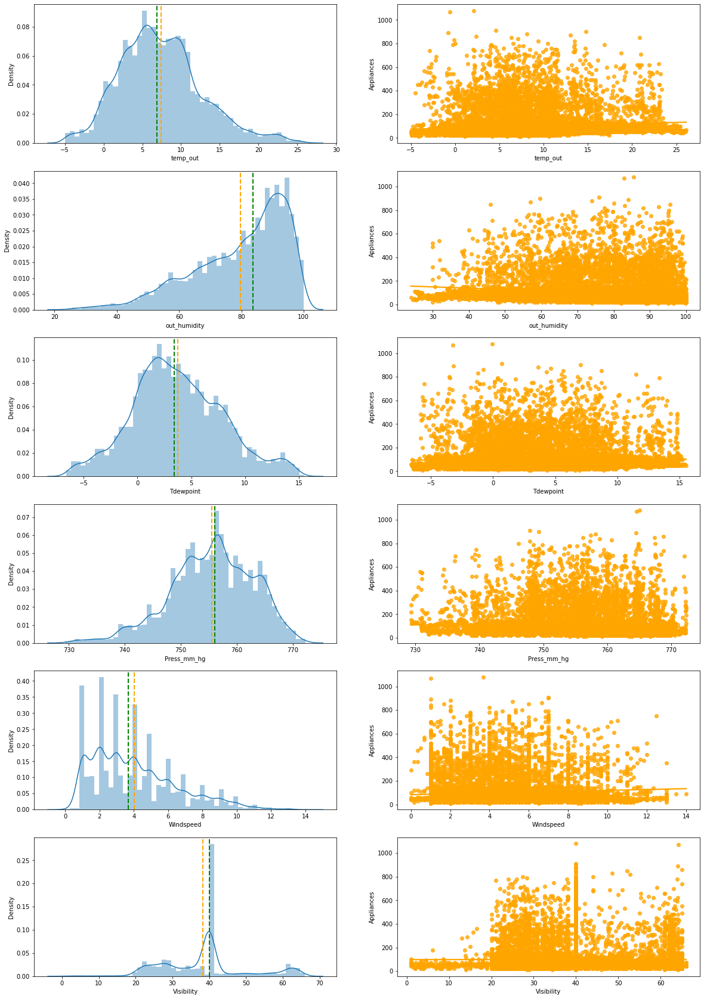

In [35]:
# Chart - 5 visualization code
fig,ax=plt.subplots(len(weather_cols),2,figsize=(20,30))
for i,col in enumerate(weather_cols):
    #univariate of the columns
    dist=sns.distplot(df_energy[col],ax=ax[i,0])
    ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
    ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
    #Bivariate Analysis the Appliance Energy
    #lineplot
    scatter=sns.regplot(data=df_energy,x=col,y='Appliances',color='orange',ax=ax[i,1]);

In [36]:
for col  in weather_cols:
    skewness = df_energy[col].skew(axis=0, skipna = True)
    print("The skweness of " ,col ,"is",skewness  )

The skweness of  temp_out is 0.5342726299233068
The skweness of  out_humidity is -0.9229972472879404
The skweness of  Tdewpoint is 0.23937407657340345
The skweness of  Press_mm_hg is -0.42044151823482934
The skweness of  Windspeed is 0.8599821006227247
The skweness of  Visibility is 0.4415544617776744


##### 1. Why did i pick the specific chart?

* Again, the reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.

* Regplot method is used to plot data and a linear regression model fit. we can observe if the feature  can fit with regression problem.

##### 2. What is/are the insight(s) found from the chart?

* Temperature outside, Presure,Tdewpoint have followed normal distribution.
* Windspeed is positively skewd
* Visibility, outside humidity are negatively skewd.
* When outside temperature is below 0 degree the spread of the enrgy used data is low. The mean value of energy used is exceptionally high near -3 and 22 degree celcius
* When outside humidity is below 40 percent,spread of the energy used data is low and it is near about gradually increase with increase the humidity.The mean value of energy used is exceptionally high near about 30 and 60 percent of humidity.
* When pressure is below 745 hg,distrbution of energy consumption low,other than it is highly spread.
* When windspeed is below 1m/s and above 12 m/s the distribution of energy consumption is low.When windspeed is 4 m/s and 9 m/s the mean energy consumption is exceptionally high.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

* when the outside temperature is below 0 degree celcius, outside humidity is below 40 percent, visibility is below 10 and dewpoint is between 0-5 the possibility of energy saving is high.
* Temperature, Humidity, Tdewpoint has high probability of colinearity. It will inspect further in upcoming section.

#### Chart - 6

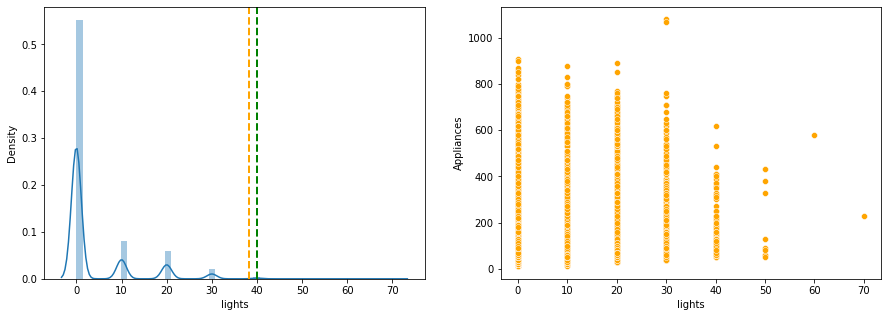

In [37]:
# Chart - 6 visualization code
fig,ax=plt.subplots(1,2,figsize=(15,5))

  #univariate of the columns
dist=sns.distplot(df_energy['lights'],ax=ax[0])
ax[0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
ax[0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
  #Bivariate Analysis the Appliance Energy
  #lineplot
scatter=sns.scatterplot(data=df_energy,x='lights',y='Appliances',color='orange',ax=ax[1]);


##### 1. Why did i pick the specific chart?

* Again, the reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.

* A scatterplot is used to plot how much a numerical feature is affected by another numerical value.

##### 2. What is/are the insight(s) found from the chart?

This column neither follows the normal distribution nor the relevant skewness.Also, because this column isn't adding many values to the dataset, we'll remove it in the upcoming step.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

It has no impact on the buisness.

#### Chart - 7
Random variable Column (Univariate+ Bivariate)

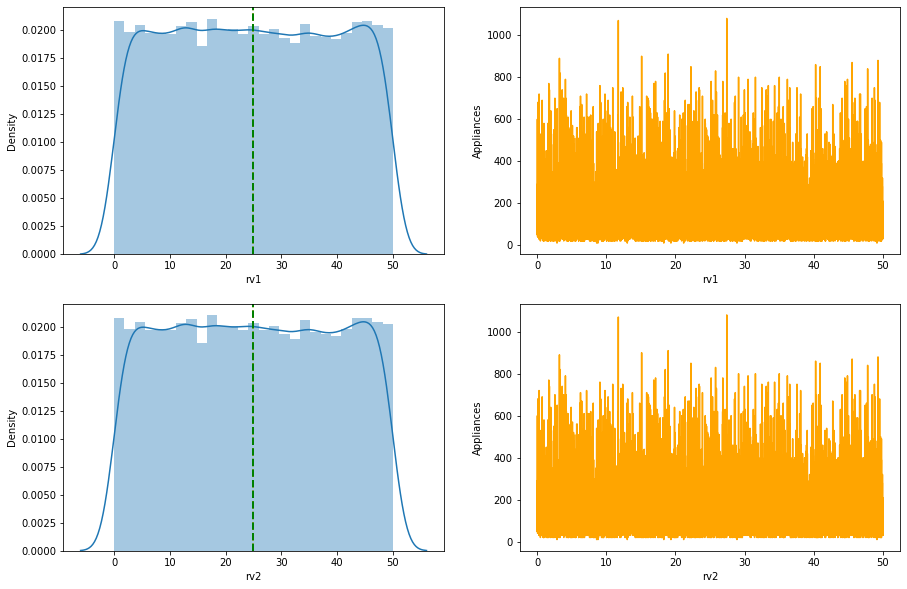

In [38]:
# Chart - 7 visualization code
fig,ax=plt.subplots(len(random_col),2,figsize=(15,10))
for i,col in enumerate(random_col):
    #univariate of the columns
    dist=sns.distplot(df_energy[col],ax=ax[i,0])
    ax[i,0].axvline(df_energy[col].mean(), color='orange', linestyle='dashed', linewidth=2)
    ax[i,0].axvline(df_energy[col].median(), color='green', linestyle='dashed', linewidth=2)
    #Bivariate Analysis the Appliance Energy
    #lineplot
    scatter=sns.lineplot(data=df_energy,x=col,y='Appliances',color='orange',ax=ax[i,1]);

##### 1. Why did i pick the specific chart?

* Again, the reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.


* A line plot is also used to observe how numerical values change over time.

##### 2. What is/are the insight(s) found from the chart?

* distribution of random variables are symmetric
* two random variable has same distribution and similar relationship with appliance energy.It leads to multicolinearity and one should must be dropped in upcoming steps.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

It has no impact on buisness.

#### Chart - 14 - Correlation Heatmap

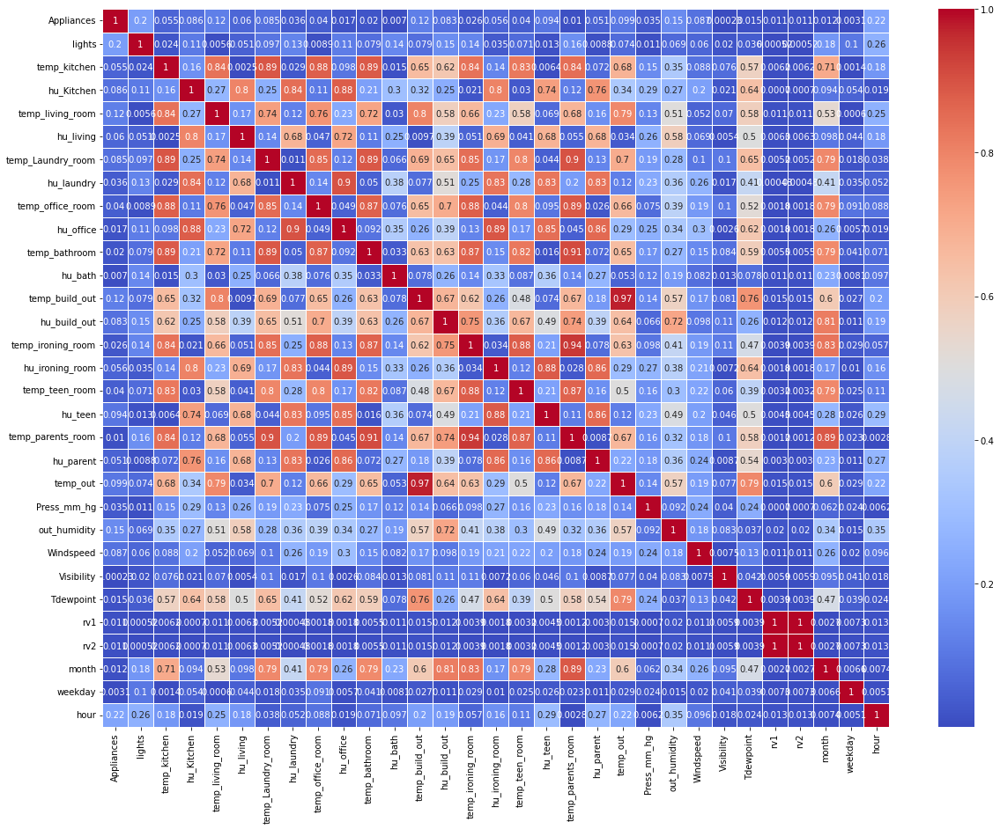

In [39]:
# Correlation Heatmap visualization code
plt.figure(figsize=(20,15))
correlation = df_energy.corr()
sns.heatmap(abs(correlation) ,annot =True , cmap = 'coolwarm', linewidth = 1)
plt.show()


##### 1. Why did i pick the specific chart?

The main reasons for using the heat map are:

* Heatmaps provide a quick overview of critical web performance factors.

* Heatmaps are a visual way to understand numerical features.

* Heatmaps assist businesses in making informed decisions that benefit the bottom line.

* It also aids in comprehending multicollinearity, which allows us to determine which features to keep and which to eliminate or combine.


##### 2. What is/are the insight(s) found from the chart?

* Temprature columns : It is clear from the heatmap that four columns have a high degree of correlation with parent_room_temperature that are temp_Laundry_room,temp_bathroom,temp_ironing_room,temp_teen_room also temp_build_out & temp_out has high correlation. Hence temp_build_out & temp_parents_room is to be removed from training set as information provided by them can be provided by other features.
* Humidity columns : For each and every humidity columns, we see moderate correlation which is workable.
* Weather_columns: Visibility, Tdewpoint, Press_mm_hg have low correlation values
* Random variables column : Similar to the trend that we have seen in the weather columns we have low correlations

### Corelation map of temperature columns

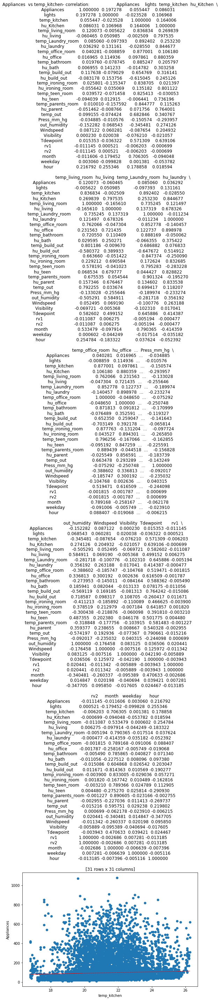

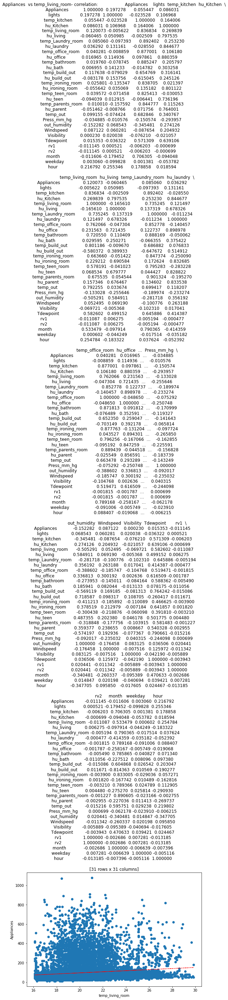

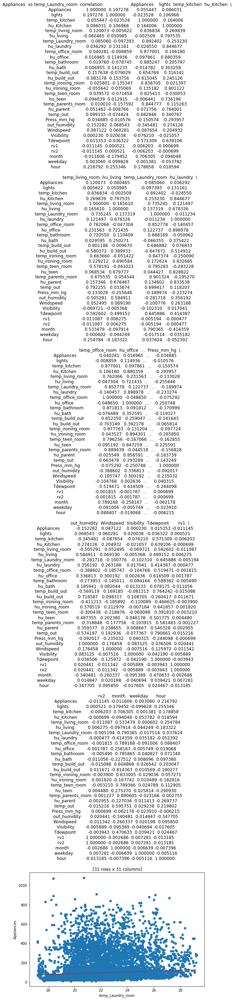

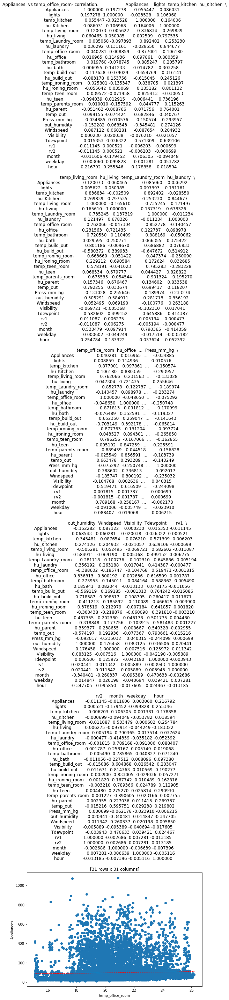

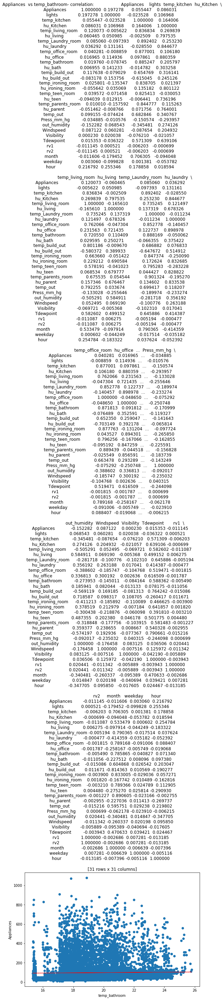

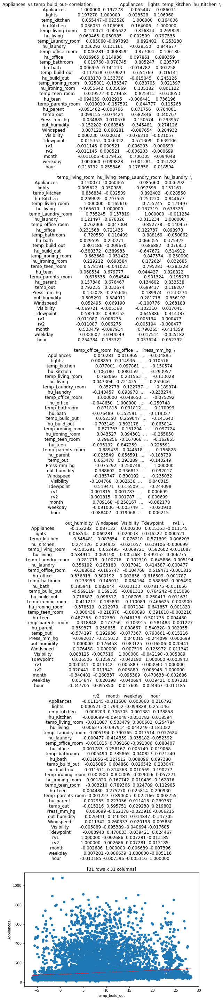

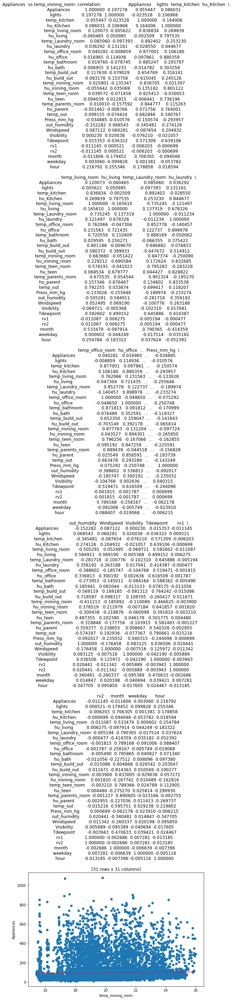

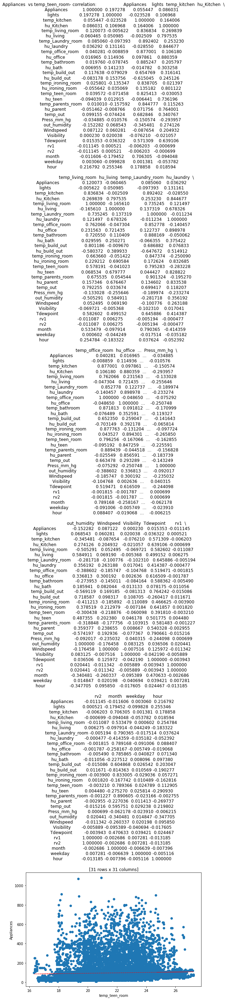

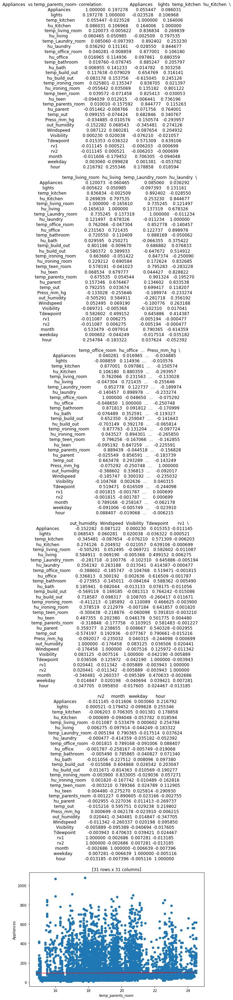

In [40]:
for col in temp_cols[:]:
    fig = plt.figure(figsize=(9,6))
    ax = fig.gca()
    feature = df_energy[col]
    label = df_energy['Appliances']
    correaltion = feature.corr(label)
    plt.scatter(x=feature,y =label)
    plt.xlabel(col)
    plt.ylabel('Appliances')
    ax.set_title('Appliances  vs ' + col + '- correlation: ' + str(correlation))
    z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
    y_hat = np.poly1d(z)(df_energy[col])

    plt.plot(df_energy[col], y_hat, "r--", lw=1)

plt.show()


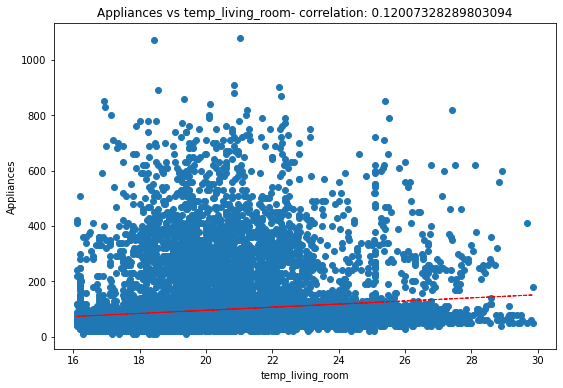

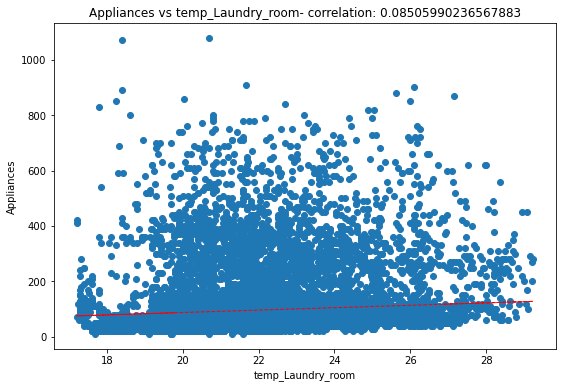

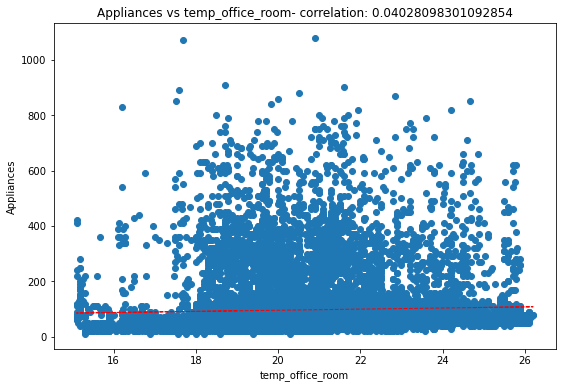

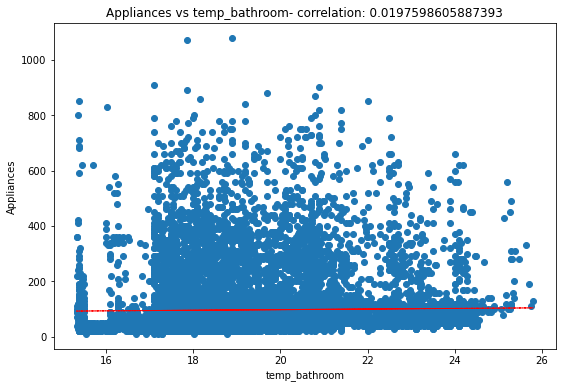

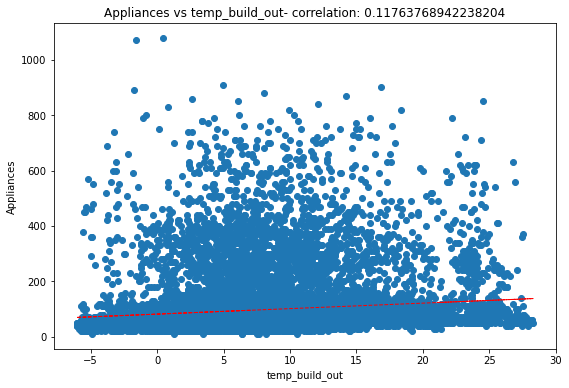

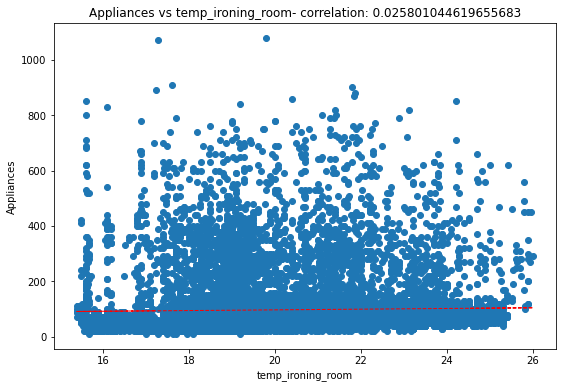

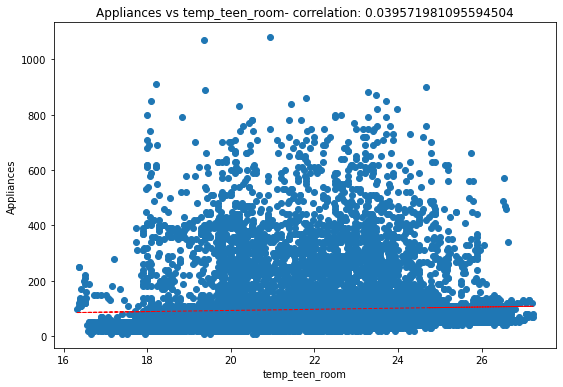

In [41]:
for col in temp_cols[1:-1]:
    fig = plt.figure(figsize=(9, 6))
    ax = fig.gca()
    feature = df_energy[col]
    label = df_energy['Appliances']
    correlation = feature.corr(label)
    plt.scatter(x=feature, y=label)
    plt.xlabel(col)
    plt.ylabel('Appliances')
    ax.set_title('Appliances vs ' + col + '- correlation: ' + str(correlation))
    z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
    y_hat = np.poly1d(z)(df_energy[col])

    plt.plot(df_energy[col], y_hat, "r--", lw=1)

plt.show()

In [42]:
for col in temp_cols[:]:
    feature = df_energy[col]
    label = df_energy['Appliances']
    correaltion = feature.corr(label)
    print('the colreation of',col ,'with Appliances is',correaltion)

the colreation of temp_kitchen with Appliances is 0.05544747185203621
the colreation of temp_living_room with Appliances is 0.12007328289803094
the colreation of temp_Laundry_room with Appliances is 0.08505990236567883
the colreation of temp_office_room with Appliances is 0.04028098301092854
the colreation of temp_bathroom with Appliances is 0.0197598605887393
the colreation of temp_build_out with Appliances is 0.11763768942238204
the colreation of temp_ironing_room with Appliances is 0.025801044619655683
the colreation of temp_teen_room with Appliances is 0.039571981095594504
the colreation of temp_parents_room with Appliances is 0.010010284644666296


##### 1. Why did i pick the specific chart?



*   this plot can illustrate the corrleation between the tempreture columns and appliance enrgy consumption
*   it shows the linear independce of one variabe with the dependent variable



##### 2. What is/are the insight(s) found from the chart?


*   The corelation value states that the all tempereature columns are less correalted with appiances and has not much siginfically linearly correaltion with each other
*  Althuough the tempreature columns are highy correlated with each other that leads to multicollineratity need to take care of in model analysis



---



### Corelation maps with humdity columns

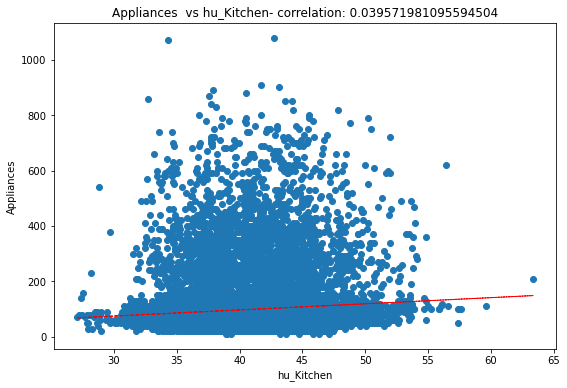

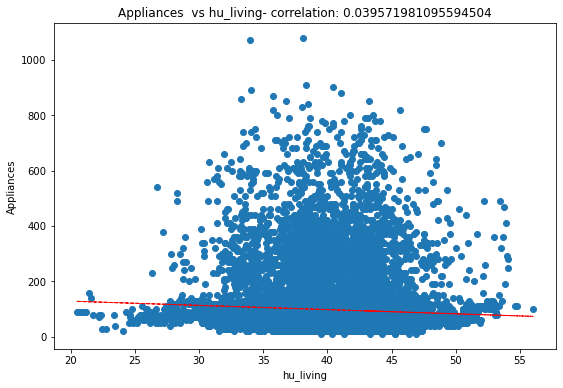

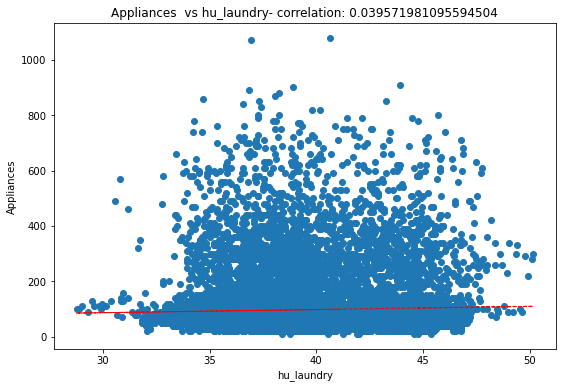

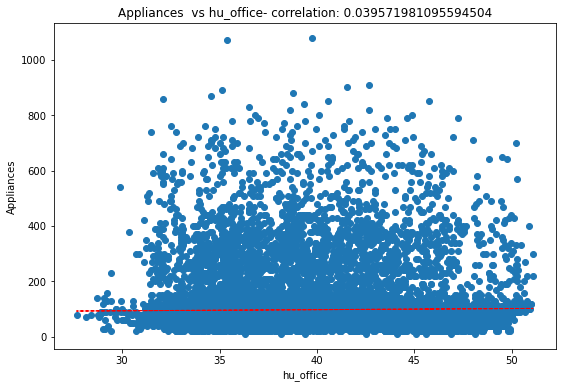

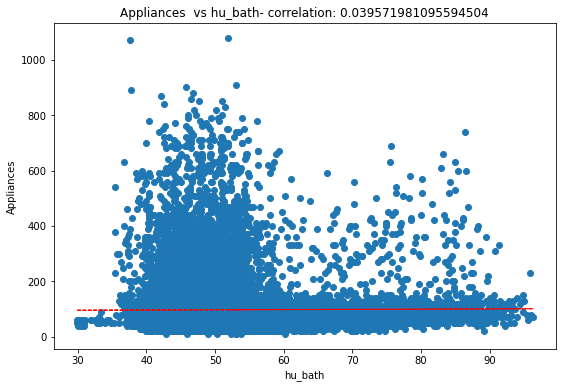

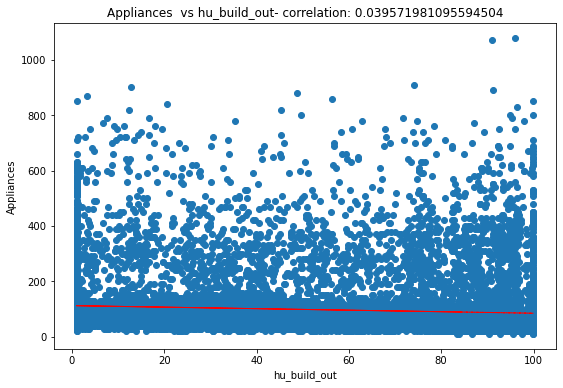

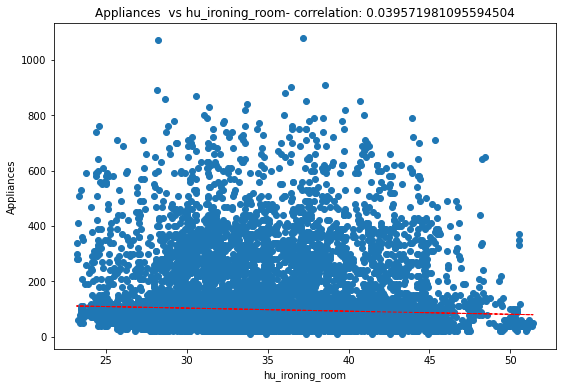

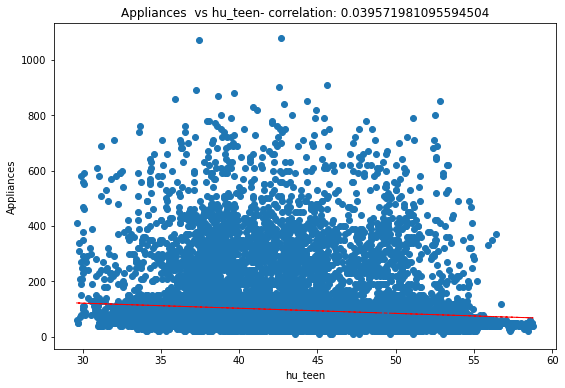

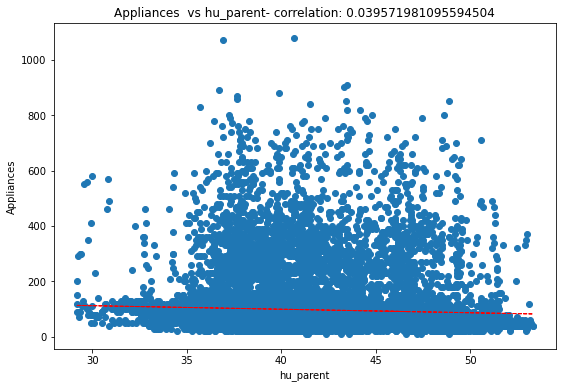

In [43]:
for col in hu_cols[:]:
    fig = plt.figure(figsize=(9,6))
    ax = fig.gca()
    feature = df_energy[col]
    label = df_energy['Appliances']
    correaltion = feature.corr(label)
    plt.scatter(x= feature,y = label)
    plt.xlabel(col)
    plt.ylabel('Appliances')
    ax.set_title('Appliances  vs ' + col + '- correlation: ' + str(correlation))
    z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
    y_hat = np.poly1d(z)(df_energy[col])

    plt.plot(df_energy[col], y_hat, "r--", lw=1)

plt.show()

In [44]:
for col in hu_cols[:]:
    feature = df_energy[col]
    label = df_energy['Appliances']
    correaltion = feature.corr(label)
    print('the colreation of',col ,'with Appliances is',correaltion)

the colreation of hu_Kitchen with Appliances is 0.0860314253115508
the colreation of hu_living with Appliances is -0.06046476002711879
the colreation of hu_laundry with Appliances is 0.03629172115353254
the colreation of hu_office with Appliances is 0.016965431418944965
the colreation of hu_bath with Appliances is 0.006954536262417966
the colreation of hu_build_out with Appliances is -0.0831776070420042
the colreation of hu_ironing_room with Appliances is -0.05564241833633217
the colreation of hu_teen with Appliances is -0.09403862707398901
the colreation of hu_parent with Appliances is -0.05146201134630328


### Corealtion maps of weather columns

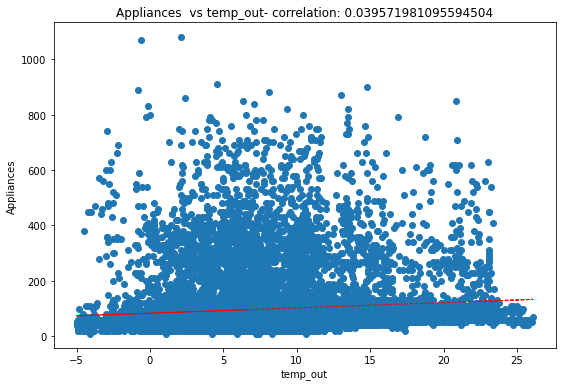

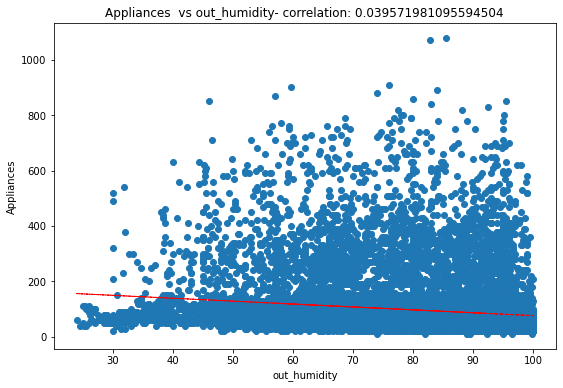

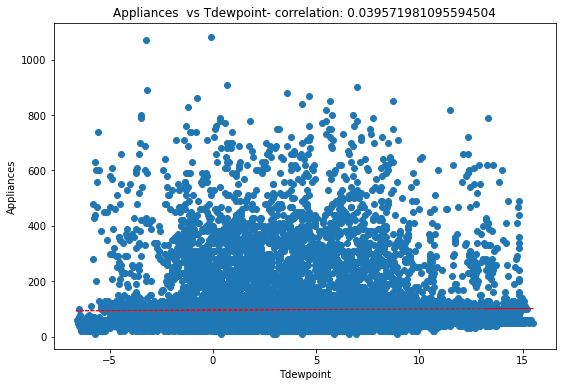

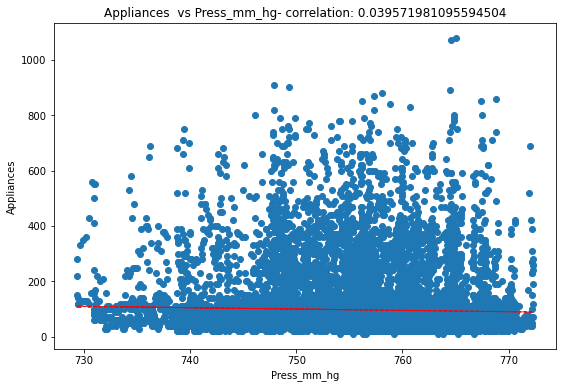

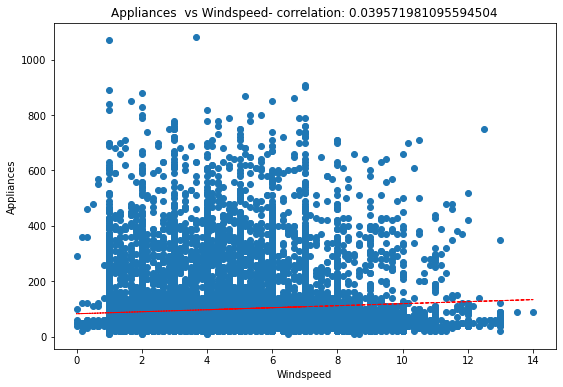

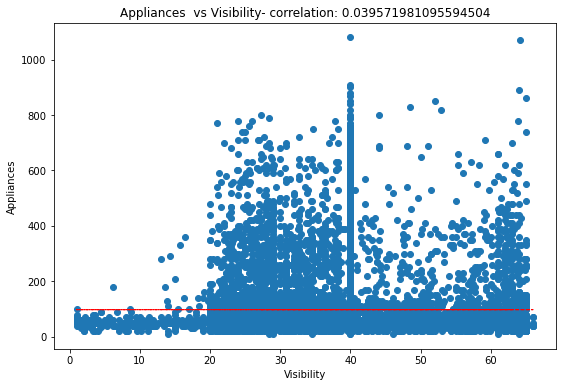

In [45]:
for col in weather_cols[:]:
    fig = plt.figure(figsize=(9,6))
    ax = fig.gca()
    feature = df_energy[col]
    label = df_energy['Appliances']
    correaltion = feature.corr(label)
    plt.scatter(x= feature,y = label)
    plt.xlabel(col)
    plt.ylabel('Appliances')
    ax.set_title('Appliances  vs ' + col + '- correlation: ' + str(correlation))
    z = np.polyfit(df_energy[col], df_energy['Appliances'], 1)
    y_hat = np.poly1d(z)(df_energy[col])

    plt.plot(df_energy[col], y_hat, "r--", lw=1)

plt.show()

In [46]:
for col in weather_cols[:]:
    feature = df_energy[col]
    label = df_energy['Appliances']
    correaltion = feature.corr(label)
    print('The corealtion of',col,'with the Appliances is ', correaltion)

The corealtion of temp_out with the Appliances is  0.09915465073995954
The corealtion of out_humidity with the Appliances is  -0.15228238090915128
The corealtion of Tdewpoint with the Appliances is  0.015353010487472691
The corealtion of Press_mm_hg with the Appliances is  -0.03488482908163531
The corealtion of Windspeed with the Appliances is  0.0871221059123584
The corealtion of Visibility with the Appliances is  0.00023035785547232838


# Appliance Energy Column

<AxesSubplot:xlabel='hour', ylabel='Appliances'>

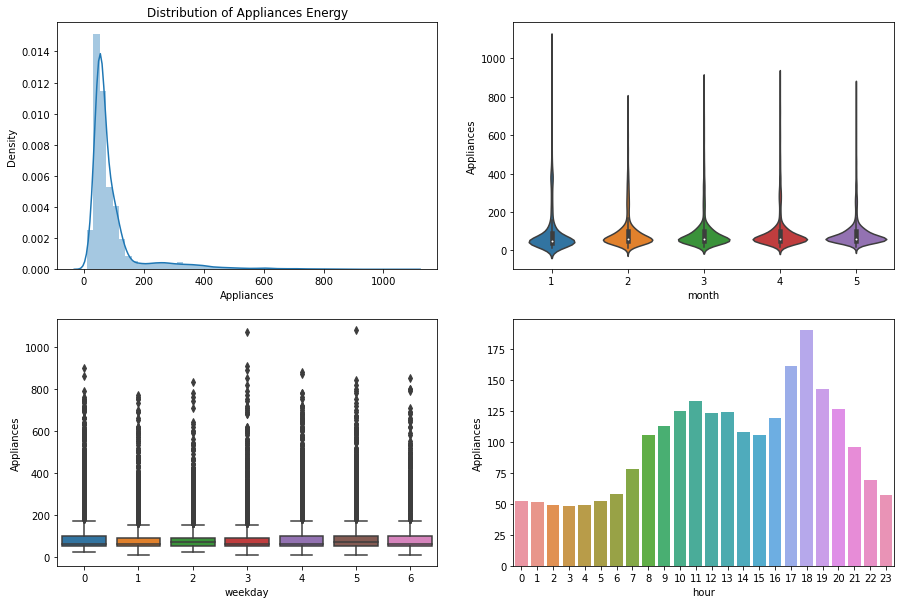

In [47]:
fig,ax=plt.subplots(2,2,figsize=(15,10))

#Distribution of Appliances
dist=sns.distplot(df_energy['Appliances'],ax=ax[0,0])
dist.set_title('Distribution of Appliances Energy')

#Average Appliances Energy over month
month_eng=pd.DataFrame(df_energy.groupby('month')['Appliances'].mean()).reset_index()
sns.violinplot(x=df_energy['month'],y=df_energy['Appliances'], ax=ax[0,1])

#Average Appliances Energy over weekdays
weekday_eng=pd.DataFrame(df_energy.groupby('weekday')['Appliances'].mean()).reset_index()
#sns.barplot(x=weekday_eng['weekday'],y=weekday_eng['Appliances'],ax=ax[1,0])
sns.boxplot(x=df_energy['weekday'],y=df_energy['Appliances'],ax=ax[1,0])
#Average Appliances Energy over hours
hour_eng=pd.DataFrame(df_energy.groupby('hour')['Appliances'].mean()).reset_index()
sns.barplot(x=hour_eng['hour'],y=hour_eng['Appliances'],ax=ax[1,1])

##### 1. Why did i pick the specific chart?

* The reason for using distplot is that it provides a quick overview of the skewness, allowing us to decide whether or not to perform the transformation.

*  Violin plots depict summary statistics and the density of each variable.

* Box plots are used to show distributions of numeric data values and compare them between multiple groups.

* Bar plots enables to compare categorical data in dependency of numerical data

##### 2. What is/are the insight(s) found from the chart?

* Appliances Enegry has positive skewness. A log transformation can make it normal. Most of the values are around 100 Wh. Outliers are also present in the column.

*  In the month of January, the energy usage is high compared to the other months, and February has low energy consumption.

* On Thursday and Saturday, the energy usage is high compared to the other days, and Tuesday has low energy consumption.

* In the hours of the day, 8 hrs to 21 hrs have high energy consumption.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

In the hours of the day from 10 PM. to 7 PM., we can save the most energy and send the excess power to the grid. In the weeks of Tuesday and February, we can save the most money on power usage.

#### Chart - 15 - Pair Plot

<Figure size 1800x1800 with 0 Axes>

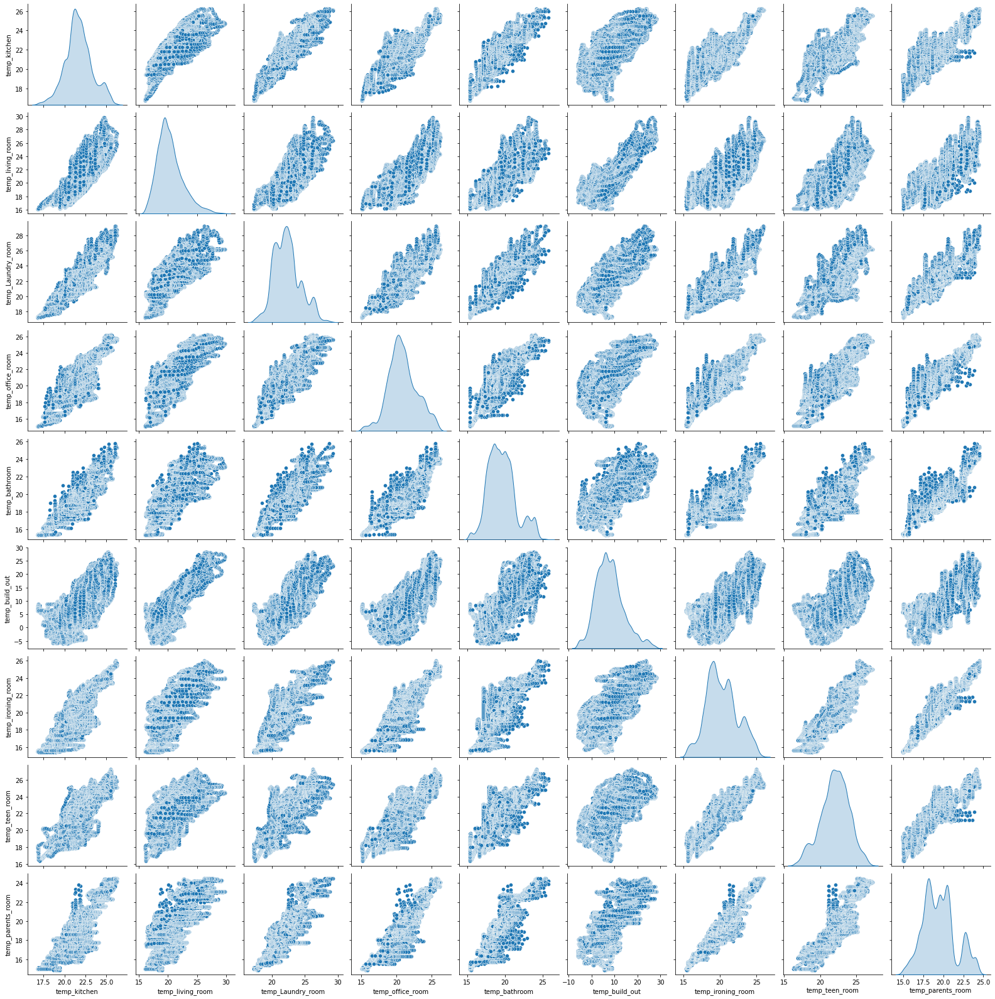

In [48]:
# Pair Plot visualization code
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[temp_cols], diag_kind='kde')
plt.show()

##### 1. Why did i pick the specific chart?

 pair plot is a data visualisation that plots pair-wise relationships between all the variables in a dataset. This helps to better understand the relationships visually.

##### 2. What is/are the insight(s) found from the chart?

* All Temperature has linear relationship with each other
* 'temperature of parents_room' with laundry room,bathroom,ironing room,teen room temperature has strong linear relationship.

<Figure size 1800x1800 with 0 Axes>

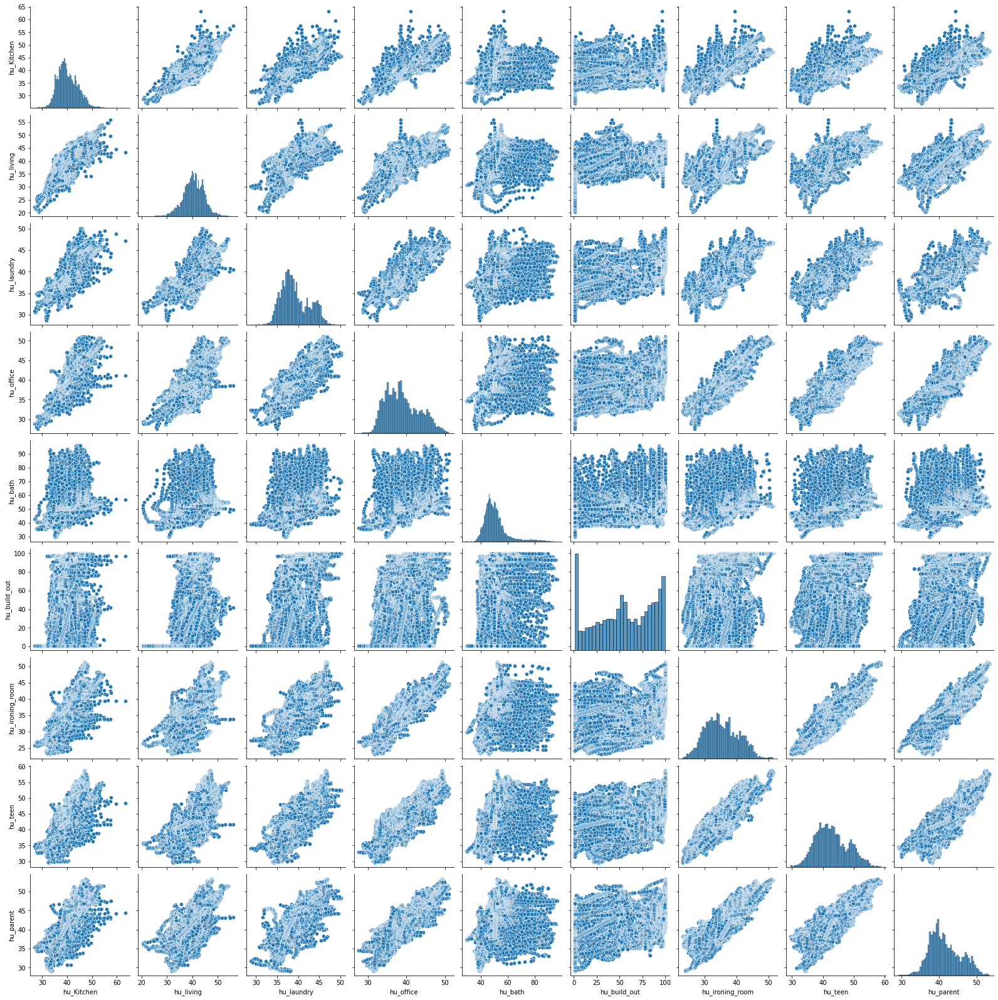

In [49]:
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[hu_cols], diag_kind='hist')
plt.show()

##### 2. What is/are the insight(s) found from the chart?

* All humidity columns have linear relationship with each other except outside building humidity and bathroom relationship.
* Humidity columns may be lead to multicolinearity.It will be treated upcoming steps.

<Figure size 1800x1800 with 0 Axes>

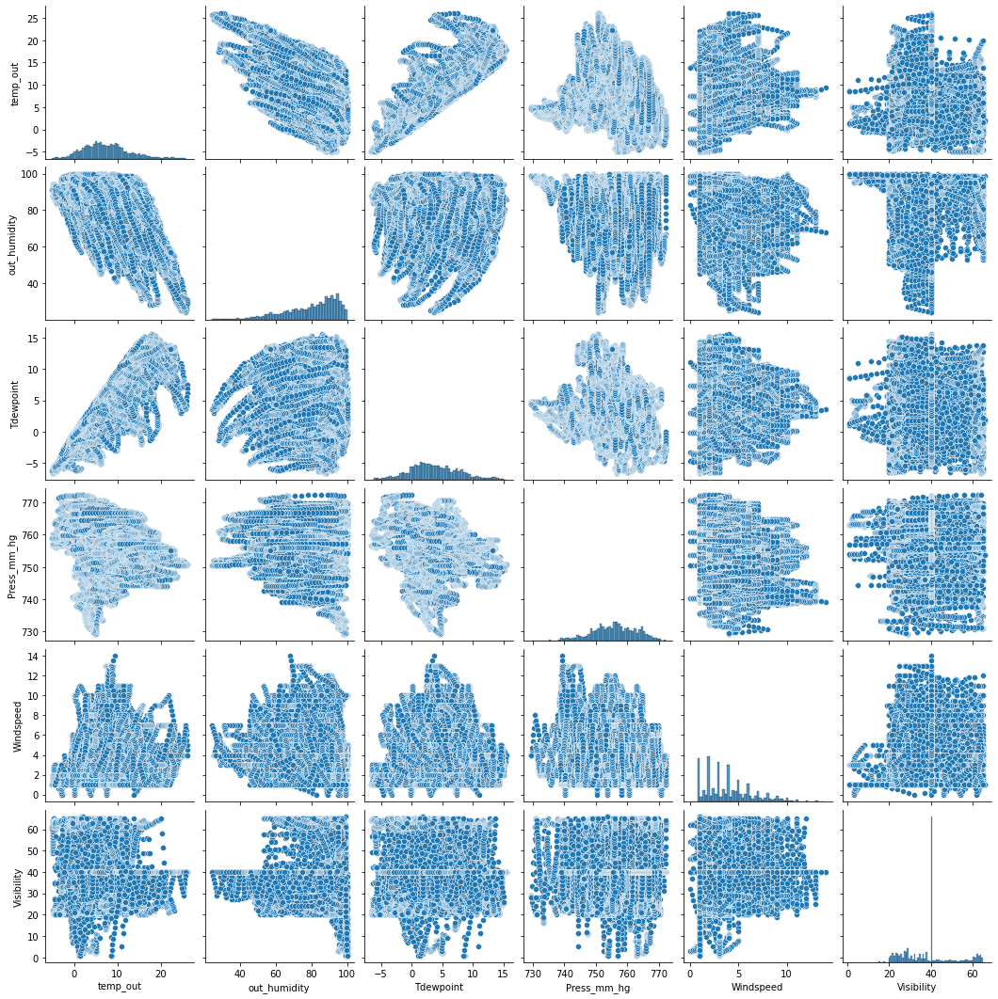

In [50]:
plt.figure(figsize=(25,25))
pair=sns.pairplot(df_energy[weather_cols], diag_kind='hist')
plt.show()

##### 2. What is/are the insight(s) found from the chart?

* Temperature and Humidity has negative linear relationship
* Temperature and Tdewpoint has positive linear relationship
* Temperature may be leads into multicolinearity.

## ***5. Hypothesis Testing***

### Based on chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through code and statistical testing.

1.  There is no change in appliance energy consumption on weekdays and weekend.

2. There is no significant difference in the energy consumption for appliances between day and night.

3. The mean temperature in kitchen is greater than normal room temperature.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Null** :- There is no change in appliance energy consumption on weekdays and weekend

**Alternate** :- There is higher appliances energy consumption on weekends as compared to weekdays.

#### 2. Perform an appropriate statistical test.

In [51]:
# Perform Statistical Test to obtain P-Value
data_weekday = df_energy[df_energy['weekday'] <= 5][['Appliances']]
data_weekend = df_energy[df_energy['weekday'] > 5][['Appliances']]

#Statistics Test and P-value
t_stat, p_val = stats.ttest_ind(data_weekday, data_weekend, equal_var=True)

print('T-Statistics value', t_stat)
print("P-Value", p_val)

T-Statistics value [1.52771504]
P-Value [0.12659933]


In [52]:
data_weekend

,Appliances
762,30
763,40
764,50
765,60
766,50
...,...
19045,60
19046,60
19047,60
19048,60


##### Which statistical test have i done to obtain P-Value?

The independent two-sample t-test is the statistical test used to calculate the P-value here.

##### Why did i choose the specific statistical test?

The specific statistical test was chosen because it is appropriate to compare the means of two separate sets of numerical data, as is the case in this situation, which compares overall consumption on weekdays against weekends. Given that the data is continuous and regularly distributed, the t-test assumes that it follows a normal distribution. The equal_var parameter is set to True, assuming that the variances of the two groups are equal.

### Hypothetical Statement - 2

#### 1. State  research hypothesis as a null hypothesis and alternate hypothesis.

**Null Hypothesis:**  The mean temperature in kitchen is greater than normal room temperature.

**Alternate Hypothesis:**  The temperature in Kitchen is at max room temperature and it can not be above it.

#### 2. Perform an appropriate statistical test.

In [53]:
# Perform Statistical Test to obtain P-Value
#collect the kitchen temperature
kitchen_rand= df_energy['temp_kitchen'].sample(1000)
N=len(kitchen_rand)
#mean of the sample
kitchen_rand_mean= kitchen_rand.mean()
#Normal room temperature
nrt = 20
# the standard deviation for population
std_pop = df_energy['temp_kitchen'].std()
# Perform Statistical Test to obtain P-Value

Z_stat = ((kitchen_rand_mean - nrt)/(std_pop/np.sqrt(N)))
print(f'Z_score is {Z_stat} ')

P_value=norm.cdf(Z_stat,0,1)
print(f'P_value is {P_value} ')

Z_score is 33.18485534032602 
P_value is 1.0 


##### Which statistical test have i done to obtain P-Value?

I used the normal cumulative distribution function with the mean and standard deviation of a random sample to calculate the Z statistics for a particular proportion and then find its P_value.

##### Why did i choose the specific statistical test?

Z statistics provides precise values for testing the hypothesis. It is easily comparable to its critical levels.According the result null hypothesis can accepeted.

### Hypothetical Statement - 3

#### 1. State our research hypothesis as a null hypothesis and alternate hypothesis.

**Null:**- The average monthly appliances energy consumption is equal

**Alternate:**- There is a significant difference in the  energy consumption for appliances between every month

#### 2. Perform an appropriate statistical test.

In [54]:
# Perform Statistical Test to obtain P-Value
data_month_1 = df_energy[df_energy['month'] == 1][['Appliances']]
data_month_2 = df_energy[df_energy['month'] == 2][['Appliances']]
data_month_3 = df_energy[df_energy['month'] == 3][['Appliances']]
data_month_4 = df_energy[df_energy['month'] == 4][['Appliances']]
data_month_5 = df_energy[df_energy['month'] == 5][['Appliances']]


#we take a stastic state will compare the any of the 5 months data to all months data to know our hypotesis is true or false

##Statistics Test and P-value
t_stat, p_val = stats.ttest_ind(data_month_1, data_month_4,equal_var=True)

print('T-Statistics value', t_stat)
print("P-Value", p_val)



T-Statistics value [-0.69439425]
P-Value [0.48745728]


##### Which statistical test have i done to obtain P-Value?

The independent two-sample t-test is the statistical test used to calculate the P-value here.

##### Why did i choose the specific statistical test?

The specific statistical test was chosen because it is appropriate to compare the means of two separate sets of numerical data, as is the case in this situation, which compares overall consumption on weekdays against weekends. Given that the data is continuous and regularly distributed, the t-test assumes that it follows a normal distribution. The equal_var parameter is set to True, assuming that the variances of the two groups are equal.**The Null hypothessis true state that the avergae energy consumotion is same between all the months**

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [55]:
# Handling Missing Values & Missing Value Imputation
Missing_Values = df_energy.isnull().sum()
Missing_Values

Appliances           0
lights               0
temp_kitchen         0
hu_Kitchen           0
temp_living_room     0
hu_living            0
temp_Laundry_room    0
hu_laundry           0
temp_office_room     0
hu_office            0
temp_bathroom        0
hu_bath              0
temp_build_out       0
hu_build_out         0
temp_ironing_room    0
hu_ironing_room      0
temp_teen_room       0
hu_teen              0
temp_parents_room    0
hu_parent            0
temp_out             0
Press_mm_hg          0
out_humidity         0
Windspeed            0
Visibility           0
Tdewpoint            0
rv1                  0
rv2                  0
month                0
weekday              0
hour                 0
dtype: int64

#### What all missing value imputation techniques have i used and why did i use those techniques?

there is no null or missing values present in data frame

### 2. Handling Outliers

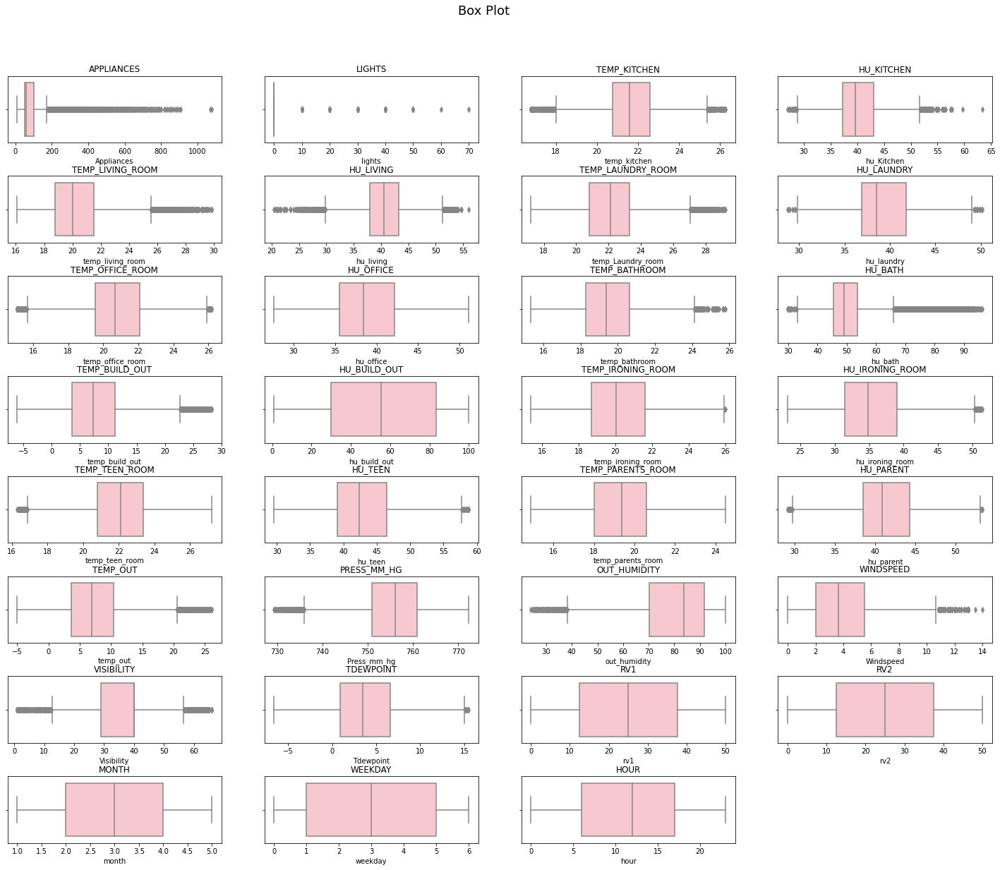

In [56]:
# Handling Outliers & Outlier treatments
df= df_energy.copy()
col_list = list(df.describe().columns)

#find the outliers using boxplot
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot", fontsize=18, y=0.95)

for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='pink', ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())


In [57]:
import pandas as pd
import numpy as np

def find_outliers_iqr(data):
    # Calculate the first quartile (Q1) and third quartile (Q3) for each column
    q1 = data.quantile(0.25)
    q3 = data.quantile(0.75)

    # Calculate the interquartile range (IQR) for each column
    iqr = q3 - q1

    # Calculate the lower and upper bounds for outliers for each column
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Check for outliers in each column and count the number of outliers
    outliers_count = (data < lower_bound) | (data > upper_bound)
    num_outliers = outliers_count.sum()

    return num_outliers


outliers_per_column = find_outliers_iqr(df_energy)
print("Number of outliers per column:")
print(outliers_per_column.sort_values(ascending = False))


Number of outliers per column:
lights               4483
Visibility           2522
Appliances           2138
hu_bath              1330
temp_living_room      546
temp_kitchen          515
temp_build_out        515
temp_out              436
out_humidity          239
hu_living             235
Press_mm_hg           219
temp_Laundry_room     217
Windspeed             214
temp_office_room      186
temp_bathroom         179
hu_Kitchen            146
temp_teen_room         71
hu_ironing_room        42
hu_parent              21
hu_teen                17
hu_laundry             15
Tdewpoint              10
temp_ironing_room       2
temp_parents_room       0
hu_build_out            0
hu_office               0
rv1                     0
rv2                     0
month                   0
weekday                 0
hour                    0
dtype: int64




*   Here three columns have highest outliers applaincec lights,hu_bathroom,visibility and other have outliers too byt less compared to the top 4
*  I am only interested to remove the outliers of fisrt top 4



In [58]:


# Handling Outliers & Outlier treatments
for ftr in col_list:
    print(ftr,'\n')
    q_25= np.percentile(df[ftr], 25)
    q_75 = np.percentile(df[ftr], 75)
    iqr = q_75 - q_25
    print('Percentiles: 25th=%.3f, 75th=%.3f, IQR=%.3f' % (q_25, q_75, iqr))
    # calculate the outlier cutoff
    cut_off = iqr * 1.5
    lower = q_25 - cut_off
    upper = q_75 + cut_off
    print(f"\nlower = {lower} and upper = {upper} \n ")
    # identify outliers
    outliers = [x for x in df[ftr] if x < lower or x > upper]
    print('Identified outliers: %d' % len(outliers))
    #removing outliers
    if len(outliers)!=0:
        

        def bin(row):

          if row[ftr]> upper:
            return upper
          if row[ftr] < lower:
            return lower
          else:
            return row[ftr]



        df[ftr] =  df.apply (lambda row: bin(row), axis=1)
        print(f"{ftr} Outliers Removed")
    print("\n-------\n")

Appliances 

Percentiles: 25th=50.000, 75th=100.000, IQR=50.000

lower = -25.0 and upper = 175.0 
 
Identified outliers: 2138
Appliances Outliers Removed

-------

lights 

Percentiles: 25th=0.000, 75th=0.000, IQR=0.000

lower = 0.0 and upper = 0.0 
 
Identified outliers: 4483
lights Outliers Removed

-------

temp_kitchen 

Percentiles: 25th=20.760, 75th=22.600, IQR=1.840

lower = 18.0 and upper = 25.36 
 
Identified outliers: 515
temp_kitchen Outliers Removed

-------

hu_Kitchen 

Percentiles: 25th=37.333, 75th=43.067, IQR=5.733

lower = 28.733333333333185 and upper = 51.666666666666806 
 
Identified outliers: 146
hu_Kitchen Outliers Removed

-------

temp_living_room 

Percentiles: 25th=18.790, 75th=21.500, IQR=2.710

lower = 14.724999999999998 and upper = 25.565 
 
Identified outliers: 546
temp_living_room Outliers Removed

-------

hu_living 

Percentiles: 25th=37.900, 75th=43.260, IQR=5.360

lower = 29.86 and upper = 51.3 
 
Identified outliers: 235
hu_living Outliers Removed

-

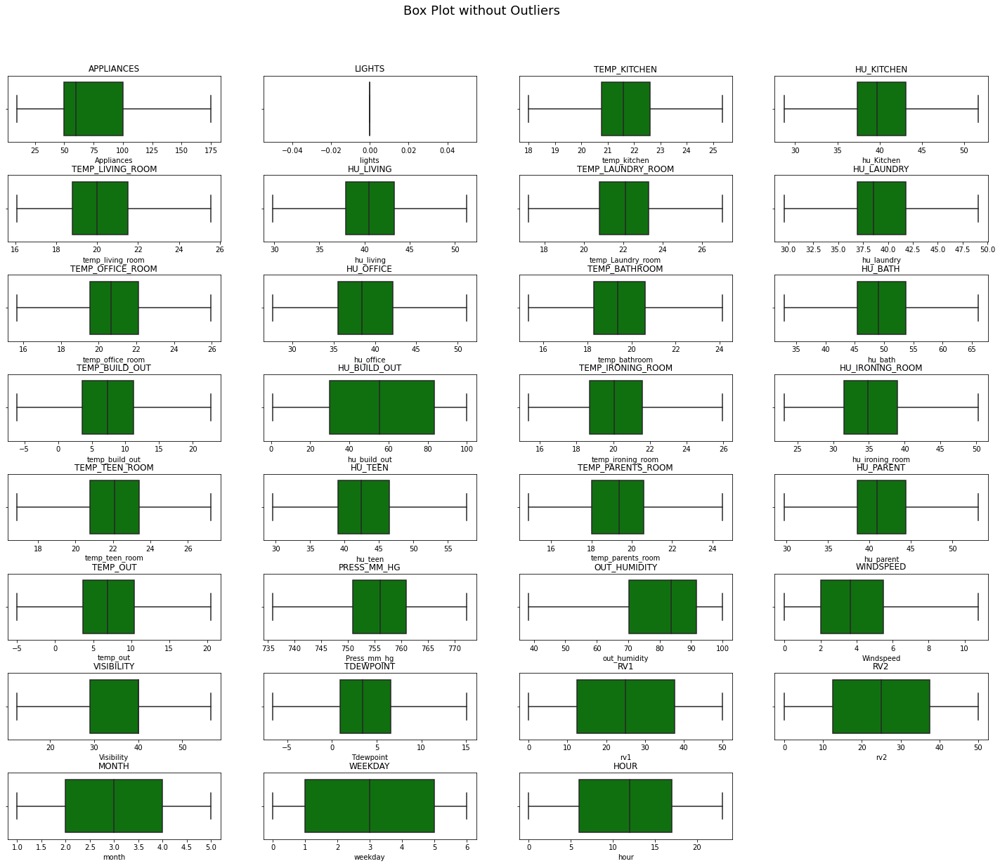

In [59]:
plt.figure(figsize=(25, 20))
plt.suptitle("Box Plot without Outliers", fontsize=18, y=0.95)
#plot the all figures in loop with boxplot
for n, ticker in enumerate(col_list):

    ax = plt.subplot(8, 4, n + 1)

    plt.subplots_adjust(hspace=0.5, wspace=0.2)

    sns.boxplot(x=df[ticker],color='g' ,ax = ax)

    # chart formatting
    ax.set_title(ticker.upper())

##### What all outlier treatment techniques have i used and why did i use those techniques?

Answer HereThe box plot is a handy graphical depiction for describing the behaviour of data in the middle and at the ends of distributions. The box plot employs the median as well as the lower and upper quartiles (defined as the 25th and 75th percentiles). If the lower quartile is Q1 and the upper quartile is Q3, the difference (Q3 — Q1) is known as the interquartile range, or IQ. A box plot is made by drawing a box between the higher and lower quartiles and a solid line across the box to find the median. The following quantities (referred to as fences) are required for recognising extreme values in the distribution's tails:

lower fence: Q1–1.5*IQ

upper fence: Q3 + 1.5*IQ

### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [60]:
# Manipulate Features to minimize feature correlation and create new features
# create new features
# create a column average building temperature based on all temperature
df['Average_building_Temperature']=df[['temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','temp_ironing_room','temp_teen_room','temp_parents_room']].mean(axis=1)
#create a column of difference between outside and inside temperature
df['Temperature_difference']=abs(df['Average_building_Temperature']-df['temp_build_out'])

#create a column average building humidity
df['Average_building_humidity']=df[['hu_Kitchen','hu_living','hu_laundry', 'hu_office','hu_bath','hu_ironing_room','hu_teen','hu_parent']].mean(axis=1)
#create a column of difference between outside and inside building humidity
df['Humidity_difference']=abs(df['hu_build_out']-df['Average_building_humidity'])


#### 2. Feature Selection

In [61]:
# Select your features wisely to avoid overfitting
#drop rv1 and rv2
df.drop('rv1',axis=1,inplace=True)
df.drop('rv2',axis=1,inplace=True)
df.head()

,Appliances,lights,temp_kitchen,hu_Kitchen,temp_living_room,hu_living,temp_Laundry_room,hu_laundry,temp_office_room,hu_office,...,Windspeed,Visibility,Tdewpoint,month,weekday,hour,Average_building_Temperature,Temperature_difference,Average_building_humidity,Humidity_difference
0,60.0,0.0,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,...,7.000000,56.500000,5.3,1,0,17,18.435000,11.408333,46.742500,37.514167
1,60.0,0.0,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,...,6.666667,56.500000,5.2,1,0,17,18.439167,11.605833,46.672708,37.390625
2,50.0,0.0,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,...,6.333333,55.333333,5.1,1,0,17,18.421667,11.861667,46.562917,36.593750
3,50.0,0.0,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,...,6.000000,51.500000,5.0,1,0,17,18.396250,11.962917,46.468750,36.954583
4,60.0,0.0,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,...,5.666667,47.666667,4.9,1,0,17,18.408750,12.042083,46.462917,38.430417


Firstly, we are going to drop two random variable column because they have no part in energy prediction.After that we will check multicolinearity among remaining columns.

**Checking Multicollinearity**

In [62]:
#create a function to check multicolinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):
    vif = pd.DataFrame()
    vif['varabiles']= X.columns
    vif['VIF'] = [round(variance_inflation_factor(X.values,i),2) for i in range(X.shape[1])]
    return (vif)

In [63]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
1,temp_kitchen,inf
13,temp_ironing_room,inf
30,Average_building_humidity,inf
29,Temperature_difference,inf
28,Average_building_Temperature,inf
18,hu_parent,inf
17,temp_parents_room,inf
2,hu_Kitchen,inf
15,temp_teen_room,inf
14,hu_ironing_room,inf


In [64]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
8,Press_mm_hg,1989.63
5,temp_parents_room,1968.13
17,Average_building_humidity,1611.76
1,temp_ironing_room,1606.03
9,out_humidity,1281.80
3,temp_teen_room,908.20
4,hu_teen,717.19
6,hu_parent,677.89
2,hu_ironing_room,537.52
7,temp_out,391.28


In [65]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
3,hu_teen,474.39
4,hu_parent,463.37
2,temp_teen_room,404.37
1,hu_ironing_room,371.97
12,Temperature_difference,121.07
5,temp_out,67.72
9,month,48.42
0,hu_build_out,38.87
8,Tdewpoint,14.51
7,Visibility,14.33


In [66]:
#check Multicolinearity
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity','hu_teen','hu_parent','temp_teen_room','hu_ironing_room']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
8,Temperature_difference,51.12
5,month,35.66
0,hu_build_out,31.07
1,temp_out,28.82
3,Visibility,13.73
4,Tdewpoint,11.12
9,Humidity_difference,7.41
2,Windspeed,5.08
7,hour,4.44
6,weekday,3.21


In [67]:
#check Multicolinearity
calc_vif(df[[i for i in df.describe().columns if i not in ['Appliances','lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity','hu_teen','hu_parent','temp_teen_room','hu_ironing_room','Temperature_difference','temp_out','Visibility']]]).sort_values(by='VIF',ascending=False)

,varabiles,VIF
6,Humidity_difference,5.35
0,hu_build_out,5.09
3,month,4.73
1,Windspeed,3.72
5,hour,3.61
4,weekday,3.18
2,Tdewpoint,2.40


In [68]:
# Select your features wisely to avoid overfitting
df_removed=df[[i for i in df.describe().columns if i not in ['lights','temp_kitchen','temp_living_room','temp_Laundry_room','temp_office_room','temp_bathroom','hu_Kitchen','hu_living','hu_laundry','hu_office','hu_bath','temp_build_out','Average_building_Temperature','Press_mm_hg','temp_parents_room','Average_building_humidity','temp_ironing_room','out_humidity','hu_teen','hu_parent','temp_teen_room','hu_ironing_room','Temperature_difference','temp_out','Visibility']]]

df_removed.head()

,Appliances,hu_build_out,Windspeed,Tdewpoint,month,weekday,hour,Humidity_difference
0,60.0,84.256667,7.000000,5.3,1,0,17,37.514167
1,60.0,84.063333,6.666667,5.2,1,0,17,37.390625
2,50.0,83.156667,6.333333,5.1,1,0,17,36.593750
3,50.0,83.423333,6.000000,5.0,1,0,17,36.954583
4,60.0,84.893333,5.666667,4.9,1,0,17,38.430417


##### What all feature selection methods have i used  and why?

I use Variance Inflation Factor(VIF) for feature selection.

The Variance Inflation Factor (VIF) is used to detect multicollinearity. Variance inflation factors (VIF) quantify how much the variance of predicted regression coefficients is inflated when the predictor variables are not linearly connected.

##### Which all features i found important and why?

In a multivariate regression model, multicollinearity exists when there is a correlation between many independent variables. Under ideal conditions, small VIF values, such as VIF< 10, suggest low correlation across variables. The VIF cutoff value is set to 10. Only variables having a VIF less than 10 will be included in the model.

According to above stated criteria, we have removed column one by one and check whether all the features vif value is less than 10 or not.Once all the vif value of features is below 10 then we stop the checking multicolinearity. Important features for the project that we have found are Appliances	hu_build_out	Windspeed	Tdewpoint	rv1	month	weekday	hour	Humidity_difference.

### 5. Data Transformation

#### Data needs to be transformed? If yes, which transformation have i used. Explain Why?

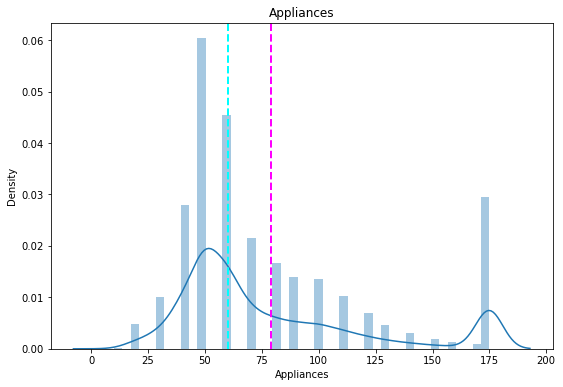

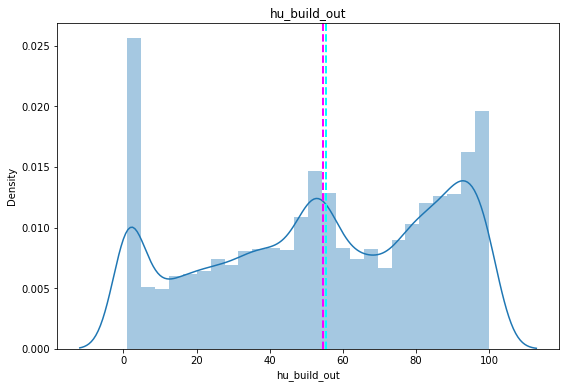

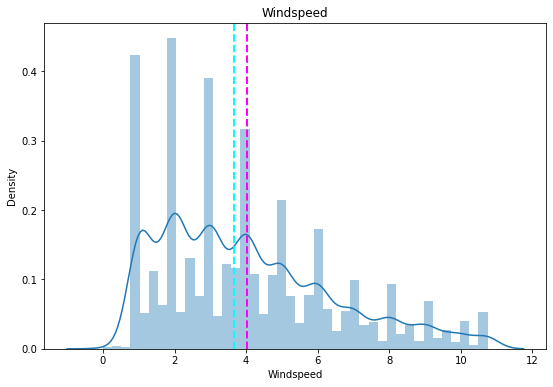

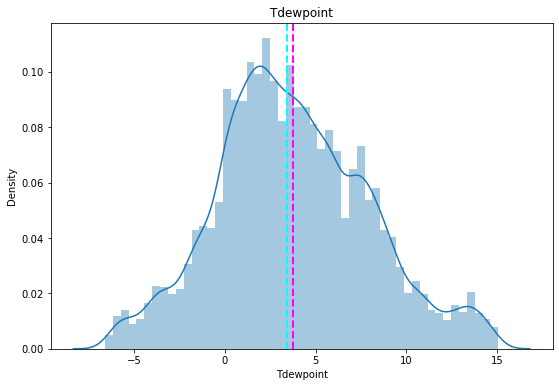

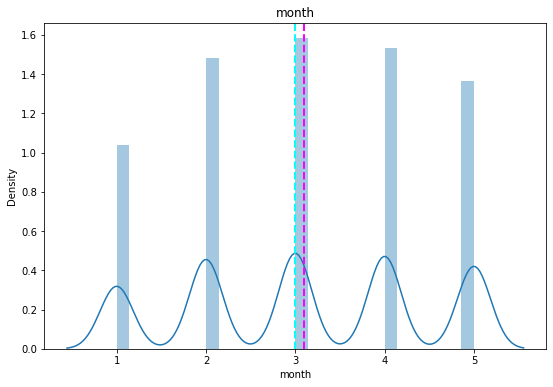

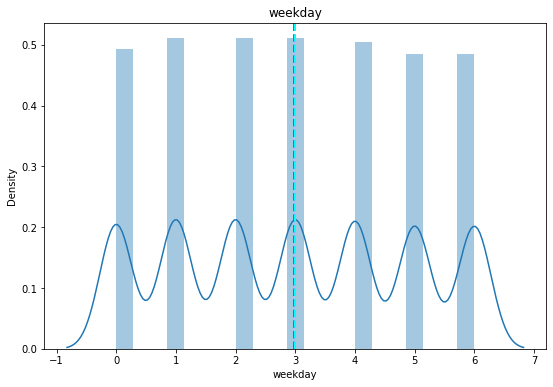

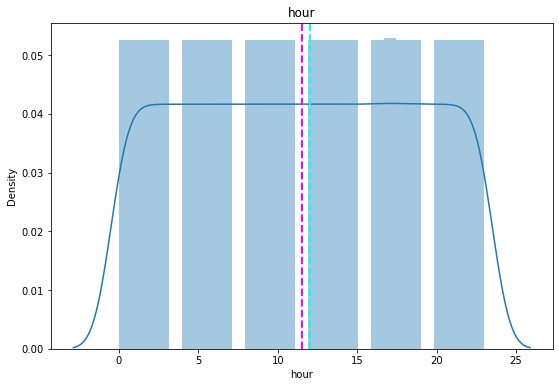

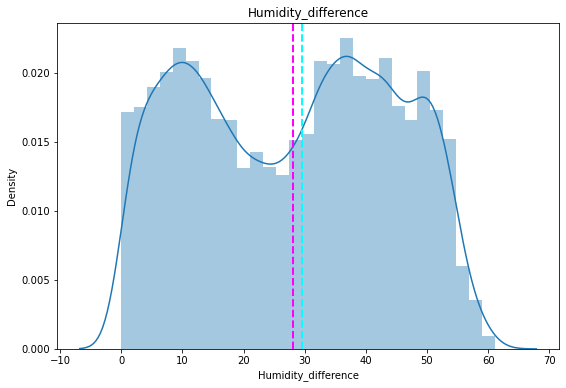

In [70]:
# Transform Your data
#check distribution  of all independent features
for col in df_removed.describe().columns:
    fig=plt.figure(figsize=(9,6))
    ax=fig.gca()
    feature= (df_removed[col])
    sns.distplot(df_removed[col])
    ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(col)
plt.show()

In [71]:
columns  = ['Appliances','hu_build_out', 'Windspeed', 'Tdewpoint', 'month', 'weekday', 'hour', 'Humidity_difference']
for col  in columns :
    skewness = df_removed[col].skew(axis=0, skipna = True)
    print("The skweness of " ,col ,"is",skewness  )

The skweness of  Appliances is 1.1561567288129546
The skweness of  hu_build_out is -0.24196120045189282
The skweness of  Windspeed is 0.7901296668359536
The skweness of  Tdewpoint is 0.23901738114277774
The skweness of  month is -0.06796901264352721
The skweness of  weekday is 0.019354272409647544
The skweness of  hour is -0.000673050093866728
The skweness of  Humidity_difference is -0.029916629673478273


In [72]:
# Transform Your data
df_removed['Appliances']=df_removed['Appliances'].apply(lambda x:np.log10(x+1))
df_removed['Windspeed']=df_removed['Windspeed'].apply(lambda x:np.log10(x+1))

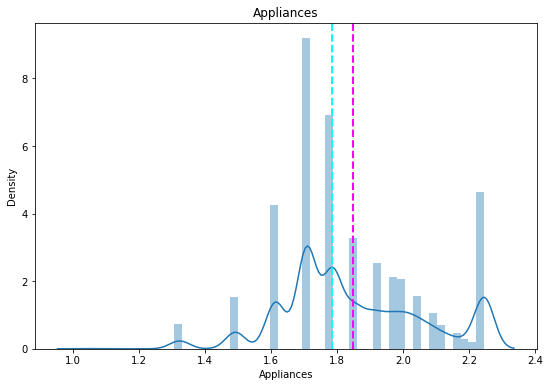

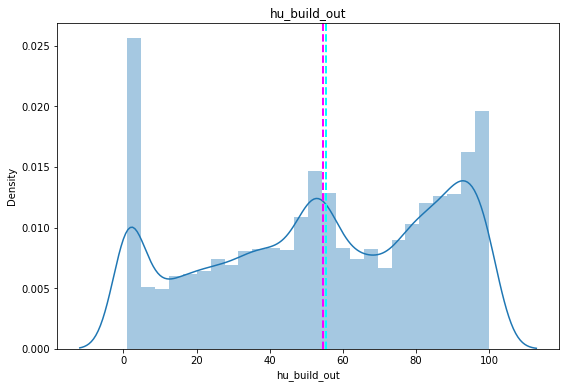

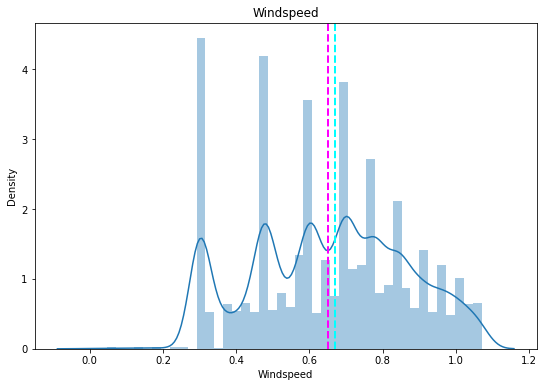

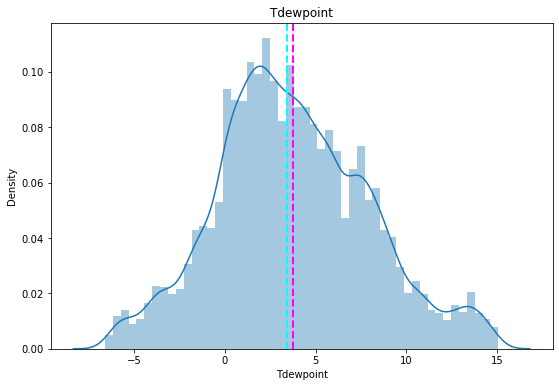

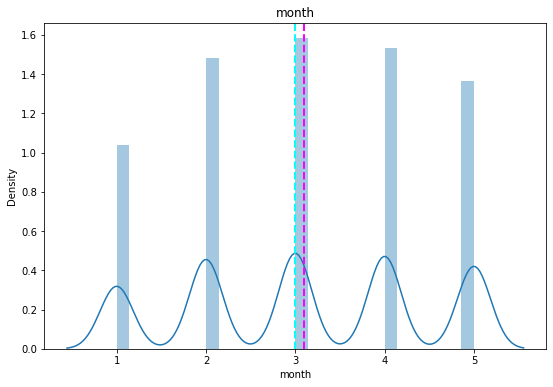

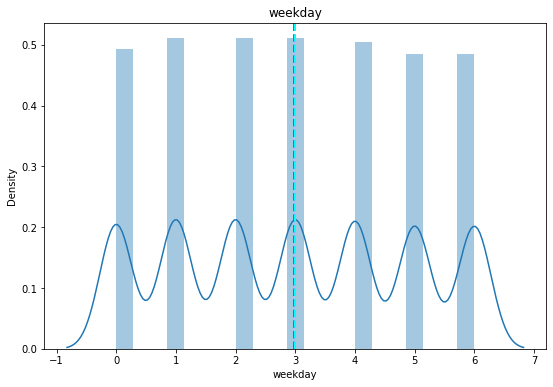

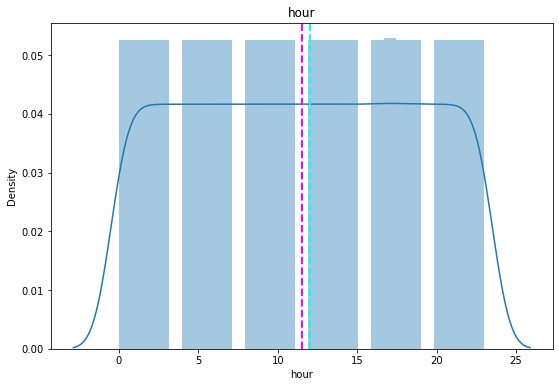

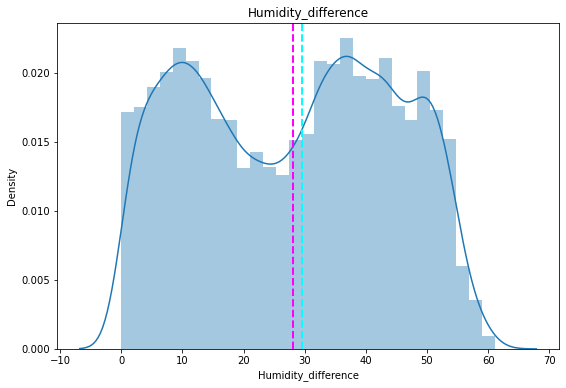

In [73]:
# check the distribution of the features after transformation
for col in df_removed.describe().columns:
    fig=plt.figure(figsize=(9,6))
    ax=fig.gca()
    feature= (df_removed[col])
    sns.distplot(df_removed[col])
    ax.axvline(feature.mean(),color='magenta', linestyle='dashed', linewidth=2)
    ax.axvline(feature.median(),color='cyan', linestyle='dashed', linewidth=2)
    ax.set_title(col)
plt.show()

### 6. Data Scaling

In [74]:
from scipy.stats import zscore
# Scaling your data
Features  = ['hu_build_out', 'Windspeed', 'Tdewpoint', 'month', 'weekday', 'hour', 'Humidity_difference']
X = df_removed[Features]
#X.shape

In [75]:
y = df_removed['Appliances']
#y =np.log10(df_removed['Appliances'])

In [85]:
df_removed.head()

,Appliances,hu_build_out,Windspeed,Tdewpoint,month,weekday,hour,Humidity_difference
0,1.78533,84.256667,0.903090,5.3,1,0,17,37.514167
1,1.78533,84.063333,0.884607,5.2,1,0,17,37.390625
2,1.70757,83.156667,0.865301,5.1,1,0,17,36.593750
3,1.70757,83.423333,0.845098,5.0,1,0,17,36.954583
4,1.78533,84.893333,0.823909,4.9,1,0,17,38.430417


### 8. Data Splitting

In [76]:
# Split your data to train and test. Choose Splitting ratio wisely.
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split( X,y , test_size = 0.2, random_state = 0)
print(X_train.shape)
print(X_test.shape)

(15788, 7)
(3947, 7)


In [77]:
# Scaling your data
# Scaling your data
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled= scaler.transform(X_test)

In [87]:
# Save the trained scaler
with open('scaler.sav', 'wb') as scaler_file:
    pickle.dump(scaler, scaler_file)

In [84]:
X_train

,hu_build_out,Windspeed,Tdewpoint,month,weekday,hour,Humidity_difference
9830,45.930000,0.602060,2.600000,3,5,23,9.263333
8112,78.400000,0.301030,-0.200000,3,1,1,39.174583
8423,57.266667,0.335792,-1.366667,3,3,4,17.099583
13059,6.466667,0.845098,4.900000,4,0,9,31.415536
2639,84.230000,1.034762,6.116667,1,5,0,37.691632
...,...,...,...,...,...,...,...
13123,22.696667,0.221849,10.416667,4,0,20,20.097500
19648,37.766667,0.602060,11.266667,5,4,3,8.538065
9845,49.530000,0.602060,2.150000,3,6,1,11.751250
10799,37.526667,0.865301,8.366667,3,5,16,4.798750


In [80]:
for i in X_test_scaled:
    print(i)

[0.         0.71578476 0.18153846 0.75       0.5        0.7826087
 0.52217671]
[0.39770812 0.65321988 0.43384615 0.75       0.5        1.
 0.01543389]
[0.40977418 0.78000287 0.51       0.5        0.66666667 0.65217391
 0.00788084]
[0.         0.65321988 0.37384615 1.         0.5        0.69565217
 0.52046064]
[0.78355241 0.28132649 0.3        0.5        0.16666667 0.17391304
 0.63760747]
[0.         0.65321988 0.63923077 1.         1.         0.65217391
 0.57860992]
[0.79130435 0.52733781 0.35538462 0.5        0.16666667 0.39130435
 0.67859265]
[0.06268959 0.61045738 0.57923077 0.75       0.5        1.
 0.51179976]
[0.01853724 0.67941402 0.87846154 1.         0.66666667 0.69565217
 0.69490808]
[0.49646107 0.72721842 0.73076923 1.         0.66666667 0.17391304
 0.11586754]
[0.41415571 1.         0.48       0.5        0.         0.30434783
 0.00933887]
[0.87832828 0.39808753 0.46307692 0.25       0.16666667 0.34782609
 0.70558049]
[0.96066734 0.52733781 0.04307692 0.         0.         0

 0.81332049]
[0.89821368 0.61045738 0.37384615 0.25       0.5        0.26086957
 0.72016285]
[0.05722952 0.72721842 0.98769231 1.         0.16666667 0.65217391
 0.64447419]
[1.         0.7383388  0.67307692 0.         0.5        0.08695652
 0.83964803]
[0.44014156 0.72721842 0.52615385 0.75       0.83333333 0.
 0.06627549]
[0.82440597 0.39808753 0.13076923 0.25       0.33333333 0.39130435
 0.76736435]
[0.         0.28132649 0.49846154 1.         0.         0.56521739
 0.58446114]
[0.05989215 0.56265298 0.43846154 1.         0.33333333 0.91304348
 0.46016466]
[0.97974385 0.72721842 0.64153846 0.         0.         1.
 0.8630026 ]
[0.513212   0.52733781 0.31384615 0.5        0.33333333 0.91304348
 0.19106268]
[1.         0.62521786 0.56461538 0.         0.83333333 0.30434783
 0.92528904]
[0.07944533 0.44589193 0.92307692 1.         0.33333333 0.73913043
 0.64489574]
[1.         0.56265298 0.64153846 0.         1.         0.82608696
 0.87920932]
[0.15530839 0.65321988 0.30923077 0.5      

 0.67803266]
[0.58687379 0.89178387 0.45692308 0.5        0.16666667 0.2173913
 0.30285886]
[0.         0.7897833  0.75076923 1.         0.         0.65217391
 0.71814711]
[0.87586788 0.39808753 0.37230769 0.25       0.33333333 0.47826087
 0.77204378]
[0.         0.28132649 0.90461538 1.         0.66666667 0.56521739
 0.73539463]
[0.04863498 0.28132649 0.93923077 1.         0.33333333 0.47826087
 0.67787754]
[0.         0.86858508 0.38076923 1.         0.83333333 0.73913043
 0.50889107]
[0.31917762 0.70401963 0.70076923 1.         0.16666667 0.04347826
 0.21059797]
[0.09767442 0.39808753 0.56923077 0.75       0.66666667 0.04347826
 0.46646953]
[0.         0.56265298 0.51692308 0.75       0.16666667 0.69565217
 0.60172368]
[0.3561847  0.56265298 0.55384615 0.75       0.66666667 0.69565217
 0.0184114 ]
[0.93822042 0.84397947 0.39       0.         0.66666667 0.30434783
 0.8188965 ]
[0.81729019 0.76998092 0.41384615 0.5        0.5        0.47826087
 0.7036504 ]
[0.87185709 0.7491626  0.52 

[0.25240984 0.83543455 0.11230769 0.25       1.         0.73913043
 0.1427908 ]
[0.44384901 0.61045738 0.41307692 0.75       0.33333333 0.08695652
 0.08615467]
[0.56319515 0.28132649 0.23615385 0.5        0.5        0.2173913
 0.27087161]
[0.72831143 0.89178387 0.57461538 0.5        0.83333333 0.39130435
 0.5152256 ]
[0.96828446 0.44589193 0.24538462 0.         0.33333333 0.7826087
 0.95465213]
[0.         0.63946031 0.27384615 0.75       0.5        0.73913043
 0.51918651]
[0.29285474 0.44589193 0.38307692 1.         0.5        0.2173913
 0.12043283]
[0.29693293 0.81778532 0.40615385 0.75       0.66666667 0.30434783
 0.09933689]
[0.27698011 0.65321988 0.32769231 0.5        0.66666667 0.60869565
 0.14089913]
[0.54833165 0.72721842 0.32769231 0.75       0.16666667 0.34782609
 0.28699183]
[0.65082575 0.56265298 0.44153846 0.5        0.33333333 0.
 0.41461849]
[0.01304348 0.56265298 0.56461538 0.75       0.5        0.91304348
 0.57540275]
[0.         0.44589193 0.42461538 1.         0.    

 0.52056502]
[0.23313111 0.65321988 0.43153846 0.75       0.5        0.91304348
 0.22785476]
[0.78692282 0.48865443 0.21230769 0.25       0.33333333 1.
 0.6877941 ]
[0.22527806 0.8086643  0.68384615 0.75       0.66666667 0.52173913
 0.31053454]
[0.04752275 0.62521786 0.97846154 1.         0.16666667 0.65217391
 0.65899609]
[0.87832828 0.72721842 0.46461538 0.25       0.16666667 0.47826087
 0.7459008 ]
[0.91469498 0.65321988 0.56923077 0.         0.         0.82608696
 0.76700858]
[0.2082912  0.72721842 0.54538462 0.75       0.66666667 1.
 0.31645036]
[0.         0.61045738 0.36307692 0.75       0.5        0.69565217
 0.53843107]
[0.80856084 0.72721842 0.29230769 0.5        0.16666667 0.39130435
 0.73542488]
[0.86754297 0.8086643  0.62461538 0.5        0.16666667 0.91304348
 0.72194071]
[1.         0.89178387 0.79692308 0.         1.         1.
 0.82374861]
[0.00674082 0.28132649 0.71538462 1.         0.66666667 0.39130435
 0.60546606]
[0.07711493 0.76998092 0.51384615 0.75       0.8333

## ***7. ML Model Implementation***

### ML Model - 1

In [85]:
# ML Model - 1 Implementation
from sklearn.linear_model import LinearRegression
# Fit the Algorithm
linear_reg =  LinearRegression().fit(X_train_scaled,y_train)

print(linear_reg.score(X_train_scaled,y_train))


# Predict on the model
y_pred = linear_reg.predict(X_test_scaled)

from sklearn.metrics import mean_squared_error

MSE  = mean_squared_error(10**(y_test), 10**(y_pred))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

from sklearn.metrics import r2_score
r2 = r2_score(10**(y_test), 10**(y_pred))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

0.18000744356346088
MSE : 1713.3686955386345
RMSE : 41.39285802573476
R2 : 0.07987525914034621
Adjusted R2 :  0.07824010473922471


In [86]:
# ML Model - 1 Implementation
#LinearRegresseion
lr=LinearRegression()
# Fit the LinearRegression
lr.fit(X_train_scaled,y_train)
#predict the target values of train data
lr_train=lr.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_lr = lr.predict(X_test_scaled)
#Evaluate the model using
mse_lr_train=mean_squared_error(y_train,lr_train)
mse_lr_test = mean_squared_error(y_test, y_pred_lr)
r2_lr_train=r2_score(y_train,lr_train)
r2_lr_test = r2_score(y_test, y_pred_lr)

print("LinearRegression Mean Squared Error:",mse_lr_test)
print("LinearRegression R^2 Score:",r2_lr_test)


##Ridge
ridge = Ridge()
# Fit the Ridge model
ridge.fit(X_train_scaled, y_train)
#predict the target values of train data
r_train=ridge.predict(X_train_scaled)
# Predict  values for the test data
y_pred_r = ridge.predict(X_test_scaled)
# Evaluate the model using metrics
mse_r_train=mean_squared_error(y_train,r_train)
mse_r_test = mean_squared_error(y_test, y_pred_r)
r2_r_train=r2_score(y_train,r_train)
r2_r_test = r2_score(y_test, y_pred_r)

print("Ridge Mean Squared Error:",mse_r_test)
print("Ridge R^2 Score:",r2_r_test)


#Lasso
lasso = Lasso()
# Fit the Lasso model on the training data
lasso.fit(X_train_scaled, y_train)
#predict the target values of train data
l_train=ridge.predict(X_train_scaled)
# Predict the target values for the test data
y_pred_l = lasso.predict(X_test_scaled)
# Evaluate the model using metrics
mse_l_train=mean_squared_error(y_train,l_train)
mse_l_test = mean_squared_error(y_test, y_pred_l)
r2_l_train=r2_score(y_train,l_train)
r2_l_test = r2_score(y_test, y_pred_l)

print("Lasso Mean Squared Error:",mse_l_test)
print("Lasso R^2 Score:",r2_l_test)

LinearRegression Mean Squared Error: 0.0391012908193655
LinearRegression R^2 Score: 0.16215106175335858
Ridge Mean Squared Error: 0.03910064077514252
Ridge R^2 Score: 0.16216499067617984
Lasso Mean Squared Error: 0.04667558705445649
Lasso R^2 Score: -0.00014833874094732913


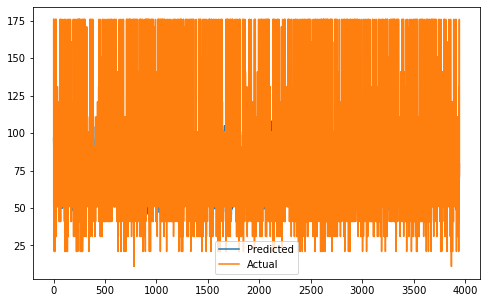

In [87]:
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred_lr))
plt.plot(10**(np.array((y_test))))
plt.legend(["Predicted","Actual"])
plt.show()

In [88]:
# Visualizing evaluation Metric Score chart
#checking the coefficients
print("The Coefficients obtain from linearrgression model",lr.coef_)
print("The Coefficients obtain from Ridge model",ridge.coef_)
print("The Coefficients obtain from Lasso model",lasso.coef_)

#checking the intercepts
print("The Intercepts obtain from linearrgression model",lr.intercept_)
print("The Intercepts obtain from Ridge model",ridge.intercept_)
print("The Intercepts obtain from Lasso model",lasso.intercept_)


The Coefficients obtain from linearrgression model [-0.12269852  0.07295185  0.0239791  -0.00555728  0.01876537  0.24656036
  0.03641629]
The Coefficients obtain from Ridge model [-0.12251812  0.07290941  0.02391033 -0.00542467  0.01875661  0.24643081
  0.03637004]
The Coefficients obtain from Lasso model [-0.  0.  0.  0.  0.  0. -0.]
The Intercepts obtain from linearrgression model 1.7109243461121477
The Intercepts obtain from Ridge model 1.7109058597483067
The Intercepts obtain from Lasso model 1.8464620149026625


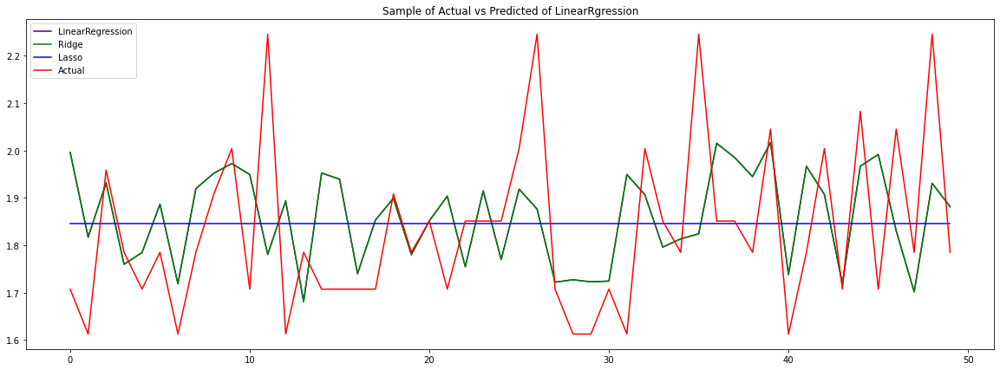

In [89]:
# Visualizing evaluation Metric Score chart
## Plot the predicted vs actual values
plt.figure(figsize=(20,7))
plt.plot(((y_pred_lr)[500:550]),color='indigo')
plt.plot(((y_pred_r)[500:550]),color='green')
plt.plot(((y_pred_l)[500:550]),color='blue')
plt.plot((np.array((y_test)[500:550])),color='red')
plt.legend(["LinearRegression","Ridge","Lasso","Actual"])
plt.title("Sample of Actual vs Predicted of LinearRgression" )
plt.show()



#### 2. Cross- Validation & Hyperparameter Tuning

In [90]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
ridge_params = {'alpha': [0.001, 0.01,0.1,0.5, 1,2,5]}
lasso_params = {'alpha': [0.0001, 0.001,0.01, 0.1,0.2,0.5,1]}

# Create Ridge and Lasso regression objects
ridge = Ridge()
lasso = Lasso()

# Create GridSearchCV objects
ridge_cv = GridSearchCV(ridge, param_grid=ridge_params, scoring='neg_mean_squared_error')
lasso_cv = GridSearchCV(lasso, param_grid=lasso_params, scoring='neg_mean_squared_error')

# Fit the models using GridSearchCV
ridge_cv.fit(X_train_scaled, y_train)
lasso_cv.fit(X_train_scaled, y_train)
# Get the best hyperparameters and fit the models again using the best hyperparameters
ridge_best = Ridge(alpha=ridge_cv.best_params_['alpha']).fit(X_train_scaled, y_train)
lasso_best = Lasso(alpha=lasso_cv.best_params_['alpha']).fit(X_train_scaled, y_train)

#predict the train data using the best models
y_train_ridge=ridge_best.predict(X_train_scaled)
y_train_lasso = lasso_best.predict(X_train_scaled)
# Predict  values for the test data using the best models
y_pred_ridge = ridge_best.predict(X_test_scaled)
y_pred_lasso = lasso_best.predict(X_test_scaled)

# Evaluate
mse_ridge_train = mean_squared_error(y_train, y_train_ridge)
mse_ridge_test = mean_squared_error(y_test, y_pred_ridge)
r2_ridge_train = r2_score(y_train, y_train_ridge)
r2_ridge_test = r2_score(y_test, y_pred_ridge)
mse_lasso_train = mean_squared_error(y_train, y_train_lasso)
mse_lasso_test = mean_squared_error(y_test, y_pred_lasso)
r2_lasso_train = r2_score(y_train, y_train_lasso)
r2_lasso_test = r2_score(y_test, y_pred_lasso)
# Print the evaluation metrics for both models
print("Ridge Regression - Best Alpha:" , ridge_cv.best_params_['alpha'])
print("Ridge Mean Squared Error:",(mse_ridge_test))
print("Ridge R^2 Score:",(r2_ridge_test))
mse_percent_ridge = mse_ridge_test * 100
r2_percent_ridge = r2_ridge_test * 100
print("Ridge - Mean squared error: {:.2f}%".format(mse_percent_ridge))
print("Ridge - R-squared: {:.2f}%".format(r2_percent_ridge))

print("\nLasso Regression - Best Alpha:",lasso_cv.best_params_['alpha'])
print("Lasso Mean Squared Error:",(mse_lasso_test))
print("Lasso R^2 Score:",(r2_lasso_test))

mse_percent_lasso = mse_lasso_test * 100
r2_percent_lasso = r2_lasso_test * 100
print("Lasso - Mean squared error: {:.2f}%".format(mse_percent_lasso))
print("Lasso - R-squared: {:.2f}%".format(r2_percent_lasso))
# Fit the Algorithm

# Predict on the model

Ridge Regression - Best Alpha: 5
Ridge Mean Squared Error: 0.03909814943686809
Ridge R^2 Score: 0.16221837421120655
Ridge - Mean squared error: 3.91%
Ridge - R-squared: 16.22%

Lasso Regression - Best Alpha: 0.0001
Lasso Mean Squared Error: 0.0390899317726112
Lasso R^2 Score: 0.16239445947919207
Lasso - Mean squared error: 3.91%
Lasso - R-squared: 16.24%


In [91]:
#create a list of metric score of linear regression
list_lr=['LinearRegression',mse_l_train,mse_l_test,r2_l_train,r2_l_test]
#create a empty dataframe for metric score columns
score = pd.DataFrame(columns = ['Model' , 'Train MSE', 'Test MSE' , 'Train R2_Score', 'Test R2_Score'])
#add the rows to the dataframe of linearrgression
score.loc[len(score)]=list_lr
#create a list of ridge metric score after hyperparameter tuning
list_ridge=['Ridge',mse_ridge_train,mse_ridge_test,r2_ridge_train,r2_ridge_test]
#add the rows to the dataframe
score.loc[len(score)]=list_ridge
#create a list of lasso metric score after hyperparameter tuning
list_lasso=['Lasso',mse_lasso_train,mse_lasso_test,r2_lasso_train,r2_lasso_test]
#add the rows to the dataframe
score.loc[len(score)]=list_lasso
print(score)

              Model  Train MSE  Test MSE  Train R2_Score  Test R2_Score
0  LinearRegression   0.038228  0.046676        0.180007      -0.000148
1             Ridge   0.038228  0.039098        0.180005       0.162218
2             Lasso   0.038229  0.039090        0.179974       0.162394


##### Which hyperparameter optimization technique have i used and why?

In this code, the GridSearchCV hyperparameter optimisation technique was employed. GridSearchCV was chosen because it thoroughly searches through a specific hyperparameter space to discover the ideal hyperparameters that would result in the greatest model performance. It is a frequently used method for hyperparameter optimisation that assures that the optimal hyperparameters are identified within the defined parameter space.


##### Have i seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes, following hyperparameter optimisation, we can see some improvement in the Ridge regression model. The MSE reduced from 0.0.03908 to 0.03907, but the R-squared score climbed from 0.1622 to 0.1623.

However, following hyperparameter optimisation, the MSE of the Lasso regression model increases somewhat from 0.04667 to 0.03907. The R-squared score, on the other hand, increased from -0.00013 to 0.1625.

### ML Model - 2

In [92]:
from sklearn.linear_model import ElasticNet
#a * L1 + b * L2
#alpha = a + b and l1_ratio = a / (a + b)
elasticnet = ElasticNet(alpha=0.1, l1_ratio=0.5)

elasticnet.fit(X_train_scaled,y_train)

y_pred_en = elasticnet.predict(X_test)

MSE  = mean_squared_error(10**(y_test), 10**(y_pred_en))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(10**(y_test), 10**(y_pred_en))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred_en)))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)))

MSE : 1963.211979982422
RMSE : 44.308148008943256
R2 : -0.05429725606490843
Adjusted R2 :  -0.05617084854839516


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

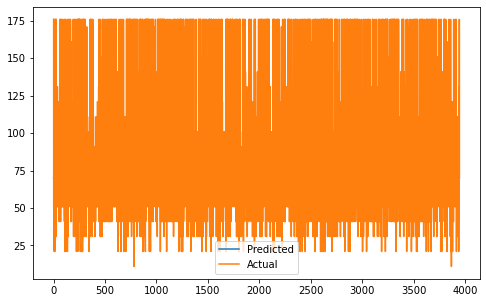

In [93]:
# Visualizing evaluation Metric Score chart
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred_en))
plt.plot((np.array(10**(y_test))))
plt.legend(["Predicted","Actual"])
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [94]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
elastic = ElasticNet()
parameters = {'alpha': [1e-15,1e-13,1e-10,1e-8,1e-5,1e-4,1e-3,1e-2,1e-1,1,5,10,20,30,40,45,50,55,60,100],'l1_ratio':[0.3,0.4,0.5,0.6,0.7,0.8]}
elastic_regressor = GridSearchCV(elastic, parameters, scoring='neg_mean_squared_error',cv=5)
elastic_regressor.fit(X_train_scaled, y_train)

print("The best fit alpha value is found out to be :" ,elastic_regressor.best_params_)
print("\nUsing ",elastic_regressor.best_params_, " the negative mean squared error is: ", elastic_regressor.best_score_)
# Fit the Algorithm
y_pred_elastic = elastic_regressor.predict(X_test_scaled)
# Predict on the model
MSE  = mean_squared_error(10**(y_test), 10**(y_pred_elastic))
print("MSE :" , MSE)

RMSE = np.sqrt(MSE)
print("RMSE :" ,RMSE)

r2 = r2_score(10**(y_test), 10**(y_pred_elastic))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score(10**(y_test), 10**(y_pred_elastic)))*((X_test_scaled.shape[0]-1)/(X_test_scaled.shape[0]-X_test_scaled.shape[1]-1)))

y_train_elastic=elastic_regressor.predict(X_train_scaled)

mse_en_train = mean_squared_error(y_train, y_train_elastic)
mse_en_test = mean_squared_error(y_test, y_pred_elastic)
r2_en_train = r2_score(y_train, y_train_elastic)
r2_en_test = r2_score(y_test, y_pred_elastic)

The best fit alpha value is found out to be : {'alpha': 0.0001, 'l1_ratio': 0.8}

Using  {'alpha': 0.0001, 'l1_ratio': 0.8}  the negative mean squared error is:  -0.038258244019401026
MSE : 1713.9973355532877
RMSE : 41.400450910023764
R2 : 0.07953766266617057
Adjusted R2 :  0.0779019083220891


In [95]:
#create a list of decion tree regressor metric  score
dtr_list=['Elasticnet',mse_en_train,mse_en_test,r2_en_train,r2_en_test]
#add the rows by list
score.loc[len(score)]=dtr_list
score

,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,0.038228,0.046676,0.180007,-0.000148
1,Ridge,0.038228,0.039098,0.180005,0.162218
2,Lasso,0.038229,0.039090,0.179974,0.162394
3,Elasticnet,0.038229,0.039090,0.179981,0.162393


### ML Model - 3

In [96]:
# Visualizing evaluation Metric Score chart
# ML Model - 2 Implementation
# define the decision tree model
model = DecisionTreeRegressor(random_state=42)

#fit the model
model.fit(X_train_scaled, y_train)

#predictions on the test set
y_pred = model.predict(X_test_scaled)

#evaluate the model
mse_DT = mean_squared_error(y_test, y_pred)
r2_DT = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_DT)
print("R-squared: ", r2_DT)

Mean squared error:  0.02255817582778063
R-squared:  0.516631209097415


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

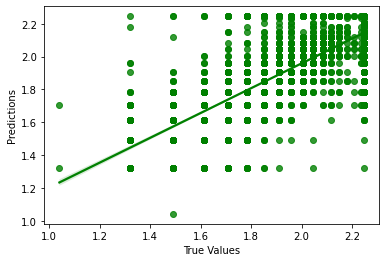

In [97]:
# Visualizing evaluation Metric Score chart
sns.regplot(x=y_test, y=y_pred, color='green')

plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.show()

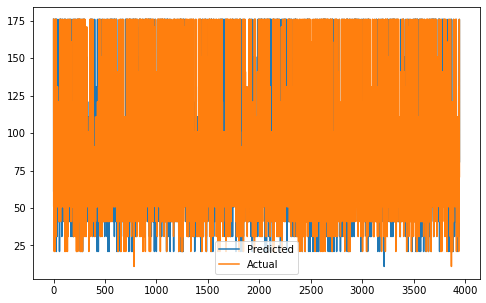

In [98]:
plt.figure(figsize=(8,5))
plt.plot(10**(y_pred))
plt.plot((np.array(10**(y_test))))
plt.legend(["Predicted","Actual"])
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [99]:
 #ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
#hyperparameter
h_param= {'max_depth': [None, 15, 20, 25],
              'min_samples_split': [20, 25, 30],
              'min_samples_leaf': [4, 8, 12]}

#grid search cv
grid_search = GridSearchCV(model, h_param, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)
print('Best parameters:', grid_search.best_params_)

dt_best = DecisionTreeRegressor(max_depth=grid_search.best_params_['max_depth'],
                                    min_samples_split=grid_search.best_params_['min_samples_split'],
                                    min_samples_leaf=grid_search.best_params_['min_samples_leaf'],
                                    random_state=0)

# Fit the Algorithm
dt_best.fit(X_train_scaled, y_train)

#predict on the training model
dtr_train=dt_best.predict(X_train_scaled)

# Predict on the model
y_pred = dt_best.predict(X_test_scaled)
#evaluate the model
mse_dsT_train=mean_squared_error(y_train,dtr_train)
mse_dsT_test = mean_squared_error(y_test, y_pred)
r2_dsT_train = r2_score(y_train, dtr_train)
r2_dsT_test = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_dsT_test)
print("R-squared: ", r2_dsT_test)

Best parameters: {'max_depth': None, 'min_samples_leaf': 8, 'min_samples_split': 20}
Mean squared error:  0.019747301483366543
R-squared:  0.5768616525344811


In [100]:
#create a list of decion tree regressor metric  score
dtr_list=['DecisionTree',mse_dsT_train,mse_dsT_test,r2_dsT_train,r2_dsT_test]
#add the rows by list
score.loc[len(score)]=dtr_list
score

,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,0.038228,0.046676,0.180007,-0.000148
1,Ridge,0.038228,0.039098,0.180005,0.162218
2,Lasso,0.038229,0.039090,0.179974,0.162394
3,Elasticnet,0.038229,0.039090,0.179981,0.162393
4,DecisionTree,0.011186,0.019747,0.760062,0.576862


##### Which hyperparameter optimization technique have i used and why?

In this code, I've utilised the GridSearchCV hyperparameter optimisation approach. GridSearchCV was chosen because it thoroughly searches through a specific hyperparameter space to discover the ideal hyperparameters that result in the greatest model performance. It is a frequently used method for hyperparameter optimisation that ensures the optimal hyperparameters are discovered within the defined parameter space.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Yes, the evaluation metrics improve after adopting hyperparameter optimisation approaches. The R-squared value has grown from 0.5232 to  0.5765, while the mean squared error has dropped from 0.02224 to 0.01975.


### ML Model - 4. Extra Tree Regression

In [101]:
# Visualizing evaluation Metric Score chart
# ML Model - 4 Implementation
# define the decision tree model
model = ExtraTreesRegressor(random_state=42)

#fit the model
model.fit(X_train_scaled, y_train)

#predictions on the test set
y_pred = model.predict(X_test_scaled)

#evaluate the model
mse_br = mean_squared_error(y_test, y_pred)
r2_br = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_br)
print("R-squared: ", r2_br)

Mean squared error:  0.012434826597016588
R-squared:  0.7335508357071546


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

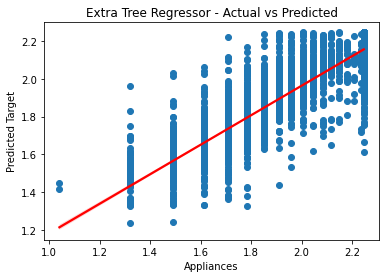

In [102]:
# Visualizing evaluation Metric Score chart
plt.scatter(y_test, y_pred)
plt.xlabel('Actual Target')
plt.ylabel('Predicted Target')
plt.title('Extra Tree Regressor - Actual vs Predicted')
sns.regplot(x=y_test, y=y_pred, scatter=False, color='red')
plt.show()

#### 2. Cross- Validation & Hyperparameter Tuning

In [104]:
 #ML Model - 4 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
#hyperparameter
h_param= { 'bootstrap': [True, False],
                          'max_depth': [70,100, None],
                          'criterion' :['squared_error'],
                          'max_features': ['log2', 'sqrt'],
                          'n_estimators': [10,1400,100]}

#grid search cv
grid_search = GridSearchCV(model, h_param, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train_scaled, y_train)
print('Best parameters:', grid_search.best_params_)

br_best = grid_search.best_estimator_

# Fit the Algorithm
br_best.fit(X_train_scaled, y_train)

#predict on the training model
br_train=br_best.predict(X_train_scaled)

# Predict on the model
y_pred = br_best.predict(X_test_scaled)
#evaluate the model
mse_br_train=mean_squared_error(y_train,br_train)
mse_br_test = mean_squared_error(y_test, y_pred)
r2_br_train = r2_score(y_train, br_train)
r2_br_test = r2_score(y_test, y_pred)

print("Mean squared error: ", mse_br_test)
print("R-squared: ", r2_br_test)

Best parameters: {'bootstrap': False, 'criterion': 'squared_error', 'max_depth': 70, 'max_features': 'log2', 'n_estimators': 1400}
Mean squared error:  0.012293553128076817
R-squared:  0.7365779947464921


### bar plot of features importances 

<AxesSubplot:>

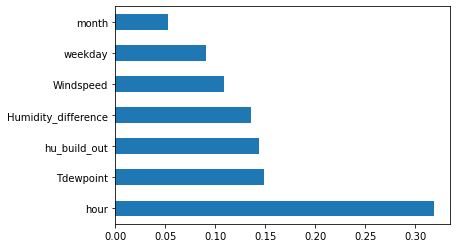

In [123]:
feat_importances = pd.Series(br_best.feature_importances_, index=X.columns)
feat_importances = feat_importances.nlargest(7)
feat_importances.plot(kind='barh')

In [105]:
#create a list of extra tree regressor metric  score
br_list=['ExtraTreeRegressor',mse_br_train,mse_br_test,r2_br_train,r2_br_test]
#add the rows by list
score.loc[len(score)]=br_list
score

,Model,Train MSE,Test MSE,Train R2_Score,Test R2_Score
0,LinearRegression,3.822783e-02,0.046676,0.180007,-0.000148
1,Ridge,3.822792e-02,0.039098,0.180005,0.162218
2,Lasso,3.822940e-02,0.039090,0.179974,0.162394
3,Elasticnet,3.822908e-02,0.039090,0.179981,0.162393
4,DecisionTree,1.118586e-02,0.019747,0.760062,0.576862
5,ExtraTreeRegressor,7.258521e-13,0.012294,1.000000,0.736578


##### Which hyperparameter optimization technique have i used and why?

In this code, I used the GridSearchCV hyperparameter optimization approach. GridSearchCV was chosen because it searches extensively over a specific hyperparameter space to discover the optimal hyperparameters that result in the greatest model performance. It is a popular method for optimising hyperparameters since it assures that the optimal hyperparameters are identified within the specified parameter space.

##### Have i seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

There is very small improvement in the evaluation metrics after implementing hyperparameter optimization techniques. The mean squared error has decreased from 0.01252 to 0.01230 and the R-squared value has increased from 0.7314 to 0.7362.

### 1. Which Evaluation metrics did i consider for a positive business impact and why?

In these circumstances, the evaluation metrics we examined for a good business impact were as follows:

**Mean Squared Error (MSE)** and

**The R2 Score**.

MSE is a measure of the average squared difference between the actual and anticipated values of the target variable. A lower MSE suggests that the model performed better in terms of prediction accuracy.

R2 Score is a statistical measure that shows the proportion of the variance in the target variable that can be explained by the independent variables. It indicates the model's goodness of fit. A higher R2 Score indicates a better fit of the model to the data and better prediction abilities.




### 2. Which ML model did i choose from the above created models as our final prediction model and why?

<AxesSubplot:title={'center':'R2 Score Results'}, xlabel='Model'>

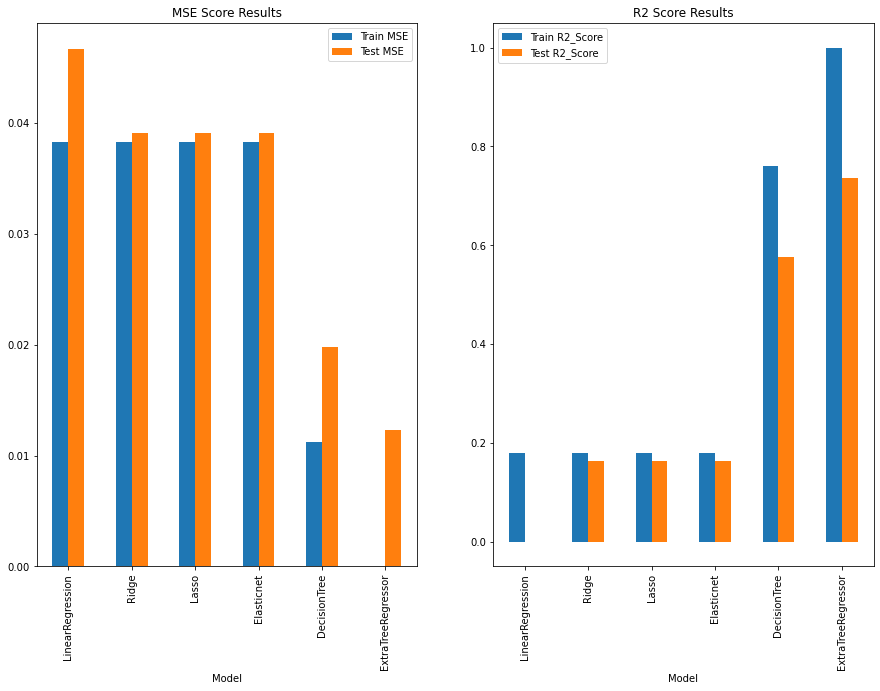

In [106]:
fig,ax=plt.subplots(1,2,figsize=(15,10))
#plot the mse of all model
score.plot(x="Model", y=['Train MSE' , 'Test MSE'], kind="bar" , title = 'MSE Score Results',ax=ax[0])
#plot the r2_score of all model
score.plot(x="Model", y=['Train R2_Score' , 'Test R2_Score'], kind="bar" , title = 'R2 Score Results',ax=ax[1])

**The ExtraTreeRegressor MODEL outperformed the other three models in terms of MEAN SQUARED ERROR and R-SQUARED value, with the lowest MSE and highest R-SQUARED value.**

**As a result, I'd go with the ExtraTreeRegressor model as the final prediction model.**

### 3. Explain the model which i have used and the feature importance using any model explainability tool?

The ExtraTreeRegressor model was chosen as the final model, which is an ensemble learning method that mixes numerous decision trees to improve forecast accuracy and prevent overfitting. It works by training a large number of decision trees and then outputs the class that is the mode of the classes (classification) or mean prediction (regression) of the individual trees.

There are some fantastic libraries like LIME,SHAP,ELI5 etc. to make thing interpretable we will make the use of ELI5 to understand our mode.

Answer Here.

## ***8.*** ***Future Work (Optional)***

In [107]:
#install ELI5
! pip install eli5

     -------------------------------------- 216.2/216.2 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107792 sha256=f2198c4d30d10e703aa5aa46bc972dd687653f13c84d66b8a61360f1b40bad9f
  Stored in directory: c:\users\pintu\appdata\local\pip\cache\wheels\cc\3c\96\3ead31a8e6c20fc0f1a707fde2e05d49a80b1b4b30096573be
Successfully built eli5



[notice] A new release of pip available: 22.2.2 -> 24.0
[notice] To update, run: python.exe -m pip install --upgrade pip


In [108]:
#import eli5
import eli5 as eli
#explain the weights
eli.explain_weights(br_best,feature_names = list(X.columns))

Weight,Feature
0.3187 ± 0.0572,hour
0.1492 ± 0.0190,Tdewpoint
0.1432 ± 0.0354,hu_build_out
0.1361 ± 0.0230,Humidity_difference
0.1092 ± 0.0172,Windspeed
0.0912 ± 0.0315,weekday
0.0523 ± 0.0231,month


### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [3]:
# Save the File
# Save the File
import pickle
filename = 'D:/energy_consumption/finalized_model.sav'
pickle.dump(br_best, open(filename, 'wb'))

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [4]:
# Load the File and predict unseen data.
loaded_model = pickle.load(open(filename, 'rb'))
y_pred_best = loaded_model.predict(X_test_best)
print(y_pred_best)
print(y_test_best)

In [117]:
len(X_test_scaled)

3947

In [118]:
X_test_scaled[0]

array([0.        , 0.71578476, 0.18153846, 0.75      , 0.5       ,
       0.7826087 , 0.52217671])

In [120]:
y_pred_best = loaded_model.predict([X_test_scaled[0]])
print(y_pred_best)
# print(y_test_best)

[2.2183583]


##### convert log value into real value in wH

In [126]:
actual_pred_value = 10**(y_pred_best) - 1
round(actual_pred_value[0], 2)

164.33

### ***Congrats! Our model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

* Linear Regression, Lasso Regression, Ridge Regression,DecisionTree Regressor,Elaticnet,Extra Tree regreesor are used to predict household appliance energy consumption.
* We compare and evaluate the best model with the lowest error and the greatest R-squared score after suitable preprocessing and fitting the fourteen models.
* temp_build_out and temp_out, temp_parents_room and temp_ironing_room had a high association with each other, thus we deleted temp_build_out and temp_parents_room. When examining the influence of the Random Variable attribute, the linear models assigned the random variable near zero weights, negating its influence in predicting the target variable.


* Inside room temperature and humidity has high variance inflation factor(VIF) so,we had to drop them
* Light consumption was evaluated highly when all factors were used. When evaluating different predictor subgroups, eliminating light usage did not appear to have a substantial influence. This could indicate that other characteristics are well connected with light energy usage.
* The pressure's significant prediction power could be attributed to its influence on wind speed and higher rainfall probability, which could potentially raise the occupancy of the residence.
* Because this dataset involves a temporal component, we believe that employing temporal Series Analysis techniques will result in superior results.
* ExtraTreeRegressor was discovered to be the best performing model, with an R-squared value of 0.7362
* Appliances	hu_build_out	Windspeed	Tdewpoint	month	weekday	hour	Humidity_difference  all play a part in energy prediction.



### ***Hurrah! I have successfully completed your Machine Learning Project !!!***